# Project 2 Social Network Mining

## Facebook network
Data: http://snap.stanford.edu/data/egonets-Facebook.html

In [1]:
library(igraph)


Attaching package: ‘igraph’

The following objects are masked from ‘package:stats’:

    decompose, spectrum

The following object is masked from ‘package:base’:

    union



### construct network

In [2]:
g = read.graph("facebook_combined.txt", format="edgelist", directed=FALSE)

### Q1, Q2: Size and diameter of GCC

In [3]:
if (is.connected(g) == TRUE) {
    print(sprintf("The graph is connected with %s nodes and %s edges.", vcount(g), ecount(g)))
    print(sprintf("Its diamater is %s.", diameter(g)))
} else {
    g.components = clusters(g)
    ix <- which.max(g.components$csize)
    g.giant <- induced.subgraph(g, which(g.components$membership == ix))
    print(sprintf("The graph is not connected with %s nodes and %s edges.", vcount(g.giant), ecount(g.giant)))
    print(sprintf("Its diamater is %s.", diameter(g.giant)))
}

[1] "The graph is connected with 4039 nodes and 88234 edges."
[1] "Its diamater is 8."


### Q3: Degree distribution

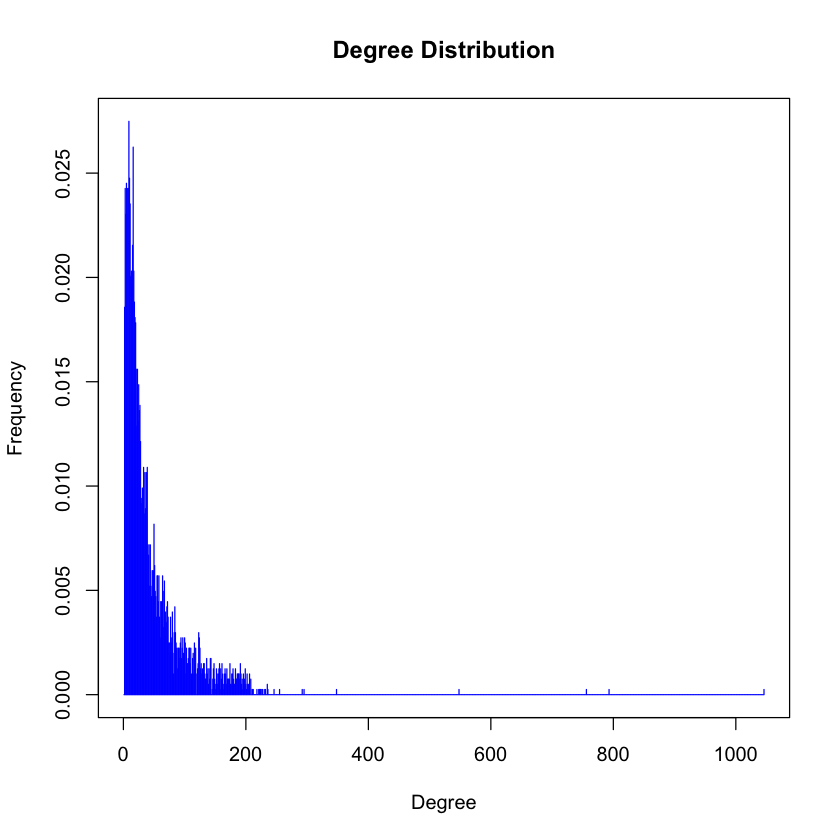

In [4]:
dd = degree.distribution(g)
plot(dd, type = "h", main = "Degree Distribution", xlab = "Degree", ylab = "Frequency", col = "blue")

In [5]:
print(sprintf("The average degree is %s.", mean(degree(g))))

[1] "The average degree is 43.6910126268878."


### Q4: Degree distribution in log-log scale

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“819 y values <= 0 omitted from logarithmic plot”

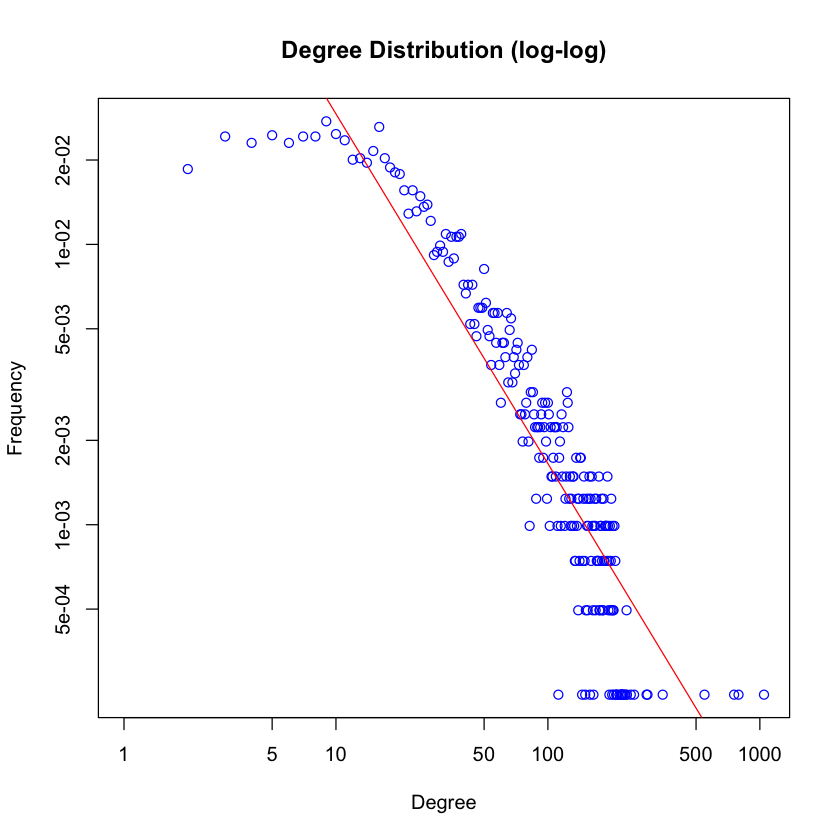

In [6]:
plot(dd, log = "yx", main = "Degree Distribution (log-log)", xlab = "Degree", ylab = "Frequency", col = "blue")
line = lm(log10(dd) ~ log10(1:length(dd)), subset = dd > 0)
abline(line, col = "red")

In [7]:
print(sprintf("The slope of the fitted line is %s.", coef(line)[2]))

[1] "The slope of the fitted line is -1.24752626790776."


### Personalized network of node 1

### Q5, Q6: Size and diameter of the personalized network

In [8]:
g_node1 = induced.subgraph(g, c(1, neighbors(g,1)))
print(sprintf("The personalized network of node 1 has %s nodes and %s edges.", vcount(g_node1), ecount(g_node1)))
print(sprintf("Its diamater is %s.", diameter(g_node1)))

[1] "The personalized network of node 1 has 348 nodes and 2866 edges."
[1] "Its diamater is 2."


Diameter upper bound: 2

Diameter lower bound: 0

### Q7
When the diameter of the personalized network equals 2, it means at least two of node 1's friends are not each other's friend.

When the diameter of the personalized network equals 0, it means node 1 has no friend.

### Core node's personalized network

### Q8: Core nodes average degree

In [9]:
count <- 0
sum <- 0
for (d in degree(g)) {
    if (d > 200) {
        count <- count + 1
        sum <- sum + d
    }
}
print(sprintf("There are %s core nodes, and the average degree is %s.", count, sum / count))

[1] "There are 40 core nodes, and the average degree is 279.375."


### Q9: Community detection

In [10]:
community_detection = function(g, id) {
    fast_greedy_community <- fastgreedy.community(g)
    edge_betweenness_community <- cluster_edge_betweenness(g)
    infomap_community <- infomap.community(g)
    
    print(sprintf("Modularity score of Fast-Greedy (node %s) is %s.", id, modularity(fast_greedy_community)))
    print(sprintf("Modularity score of Edge-Betweenness (node %s) is %s.", id, modularity(edge_betweenness_community)))
    print(sprintf("Modularity score of Infomap (node %s) is %s.", id, modularity(infomap_community)))

    plot(g, vertex.color = fast_greedy_community$membership, vertex.label=NA, vertex.size=4, main = sprintf("Community Structure by Fast-Greedy (Node %s)", id))
    plot(g, vertex.color = edge_betweenness_community$membership, vertex.label=NA, vertex.size=4, main = sprintf("Community Structure by Edge-Betweenness (Node %s)", id))
    plot(g, vertex.color = infomap_community$membership, vertex.label=NA, vertex.size=4, main = sprintf("Community Structure by Infomap (Node %s)", id))
}

[1] "Modularity score of Fast-Greedy (node 1) is 0.413101372834235."
[1] "Modularity score of Edge-Betweenness (node 1) is 0.353302172546335."
[1] "Modularity score of Infomap (node 1) is 0.389118471050977."


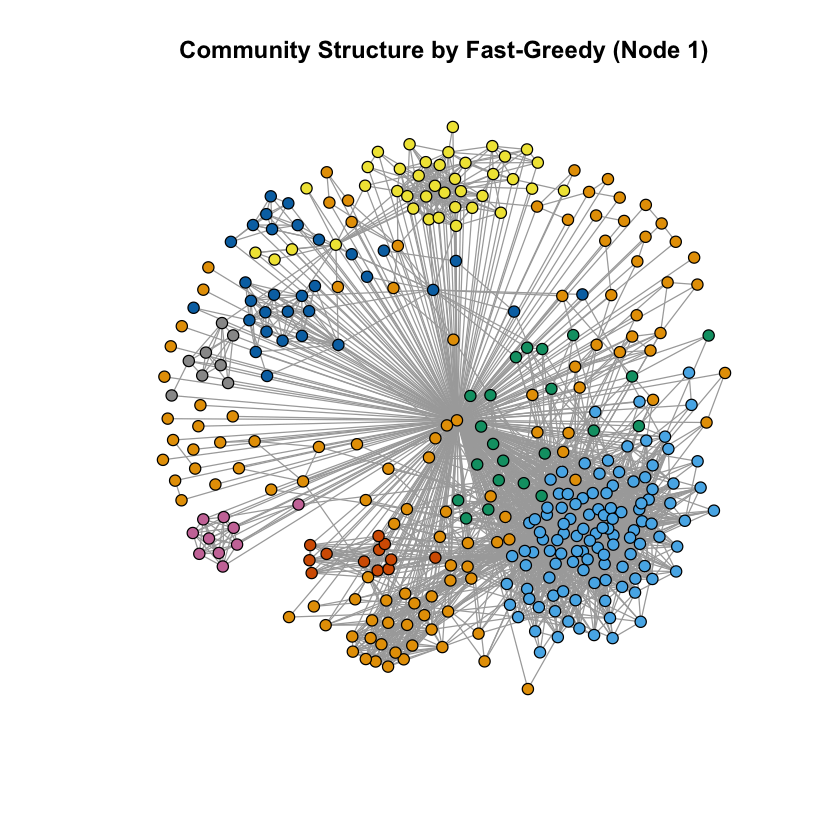

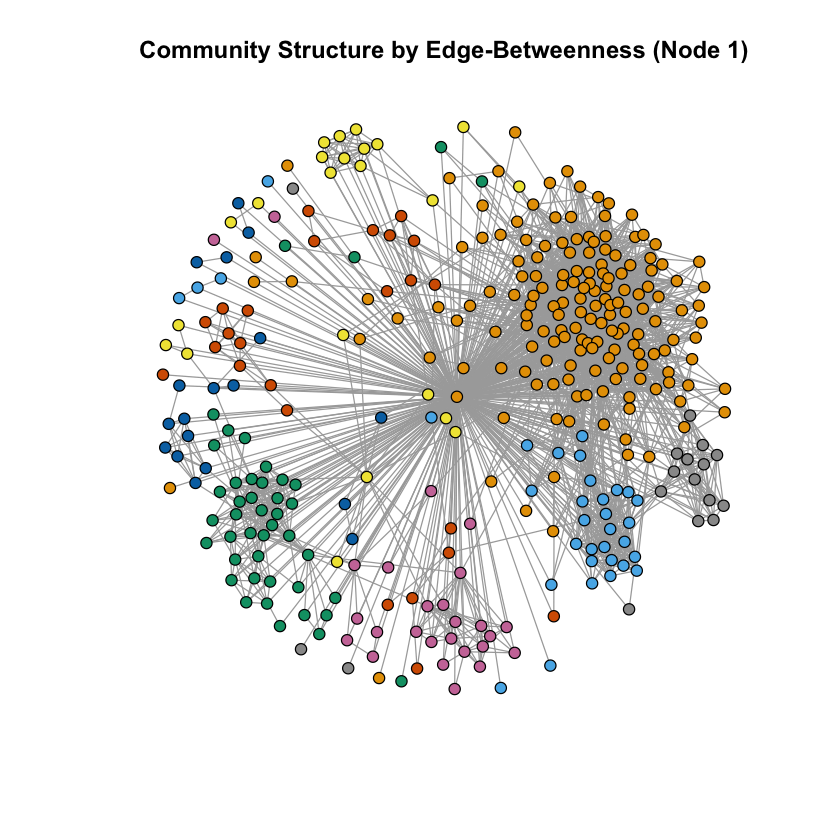

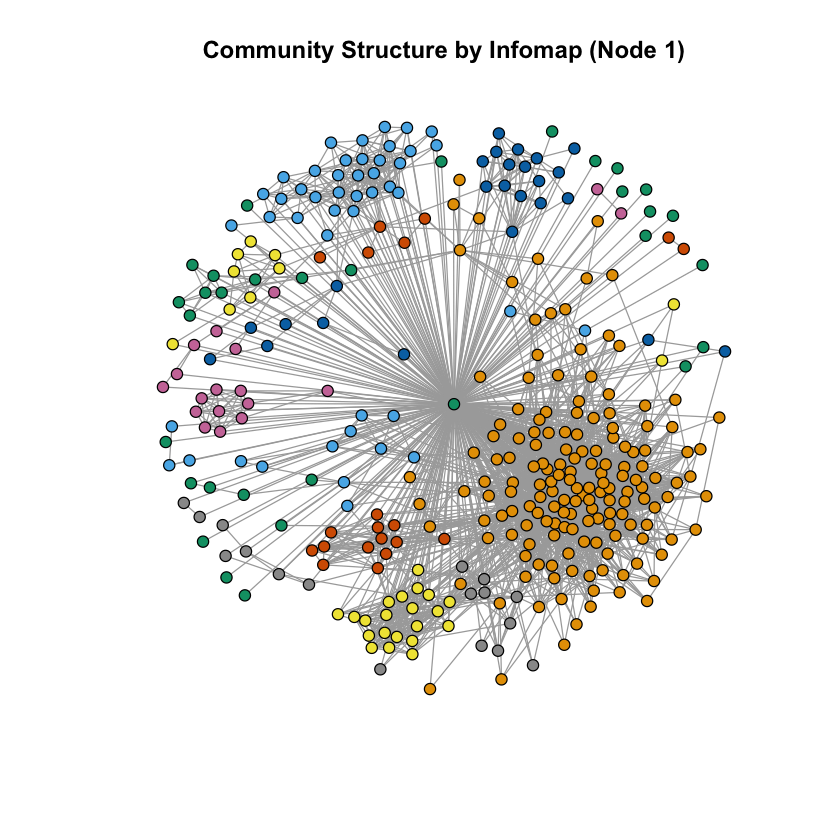

In [11]:
community_detection(g_node1, 1)

[1] "Modularity score of Fast-Greedy (node 108) is 0.435929376026475."
[1] "Modularity score of Edge-Betweenness (node 108) is 0.506754916538902."
[1] "Modularity score of Infomap (node 108) is 0.508249171320581."


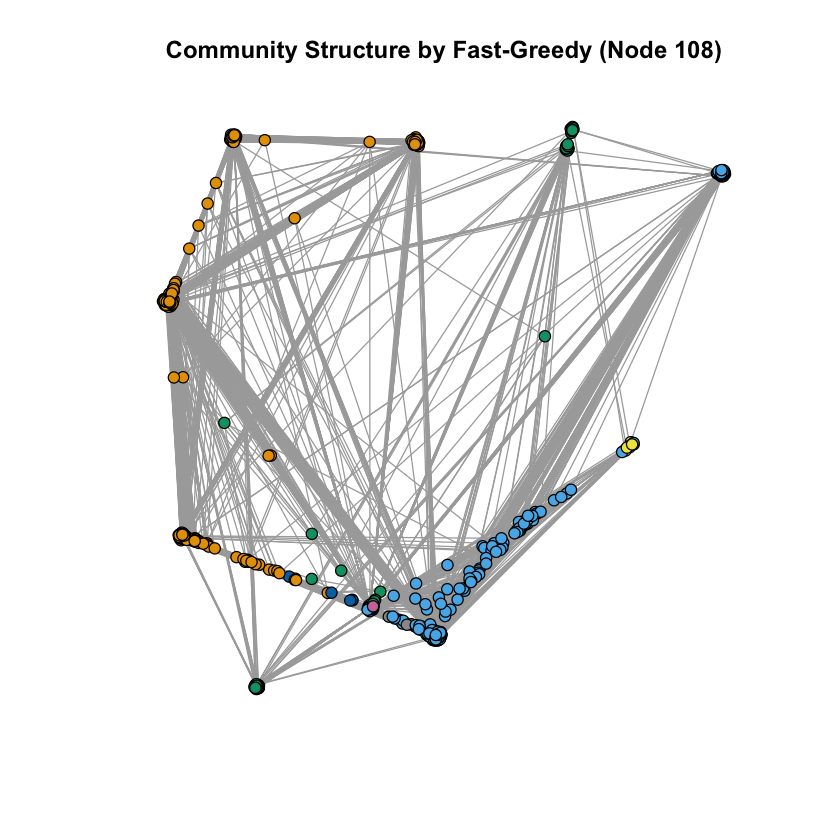

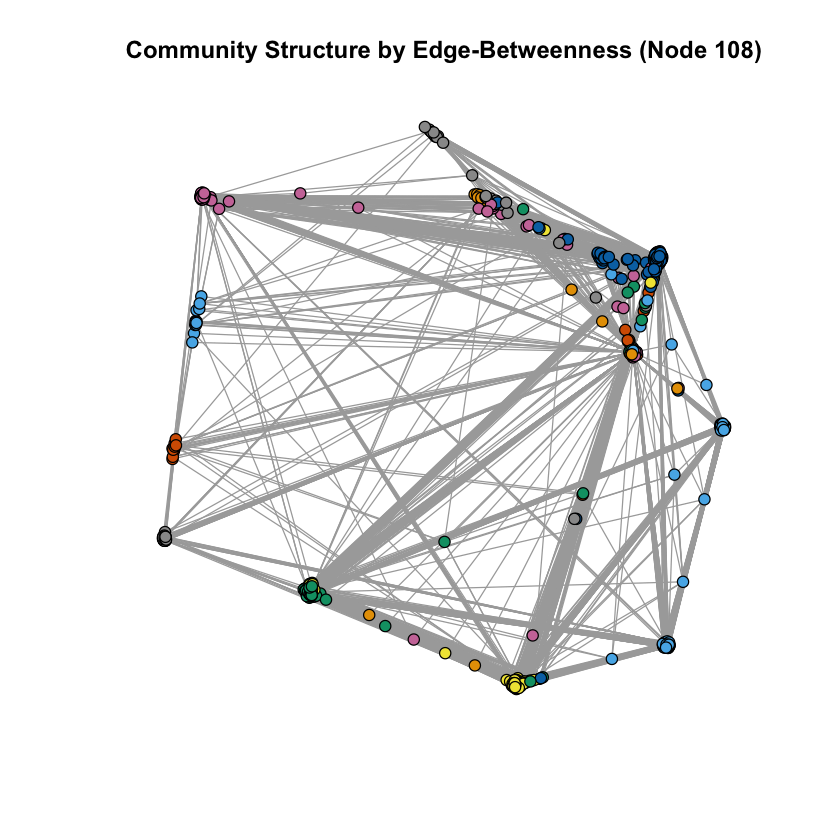

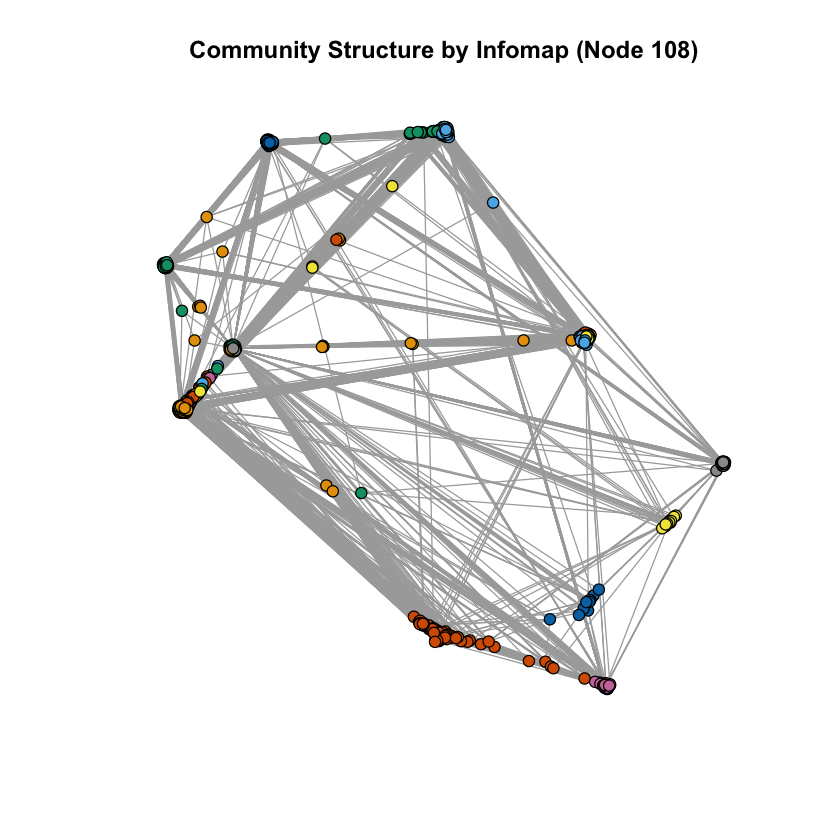

In [18]:
community_detection(induced.subgraph(g, c(108, neighbors(g,108))), 108)

[1] "Modularity score of Fast-Greedy (node 349) is 0.251714858543331."
[1] "Modularity score of Edge-Betweenness (node 349) is 0.133528021370078."
[1] "Modularity score of Infomap (node 349) is 0.0954641960913581."


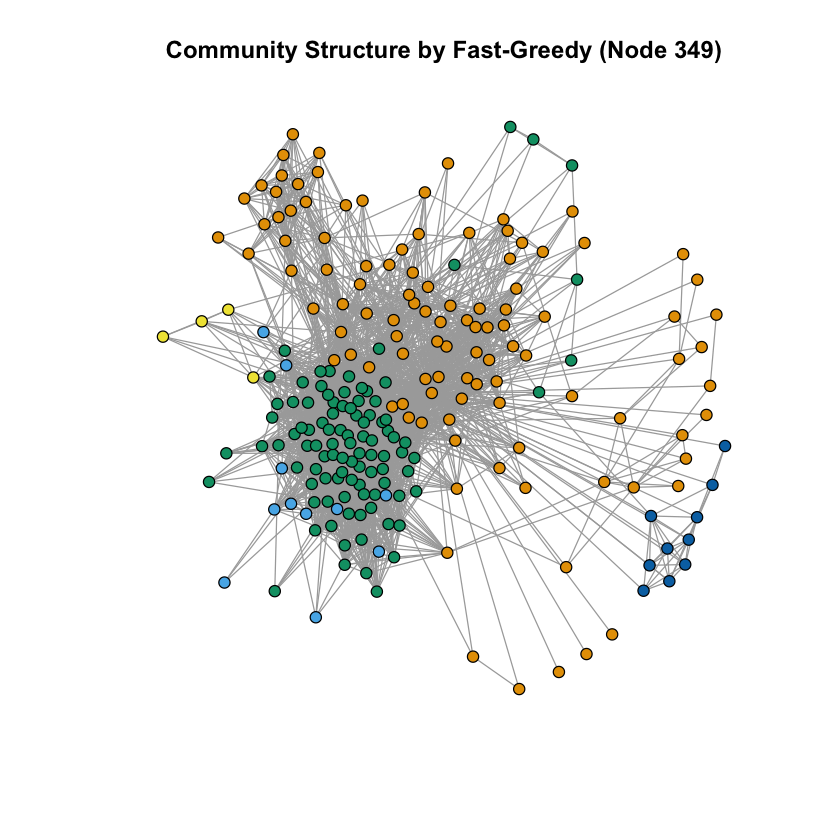

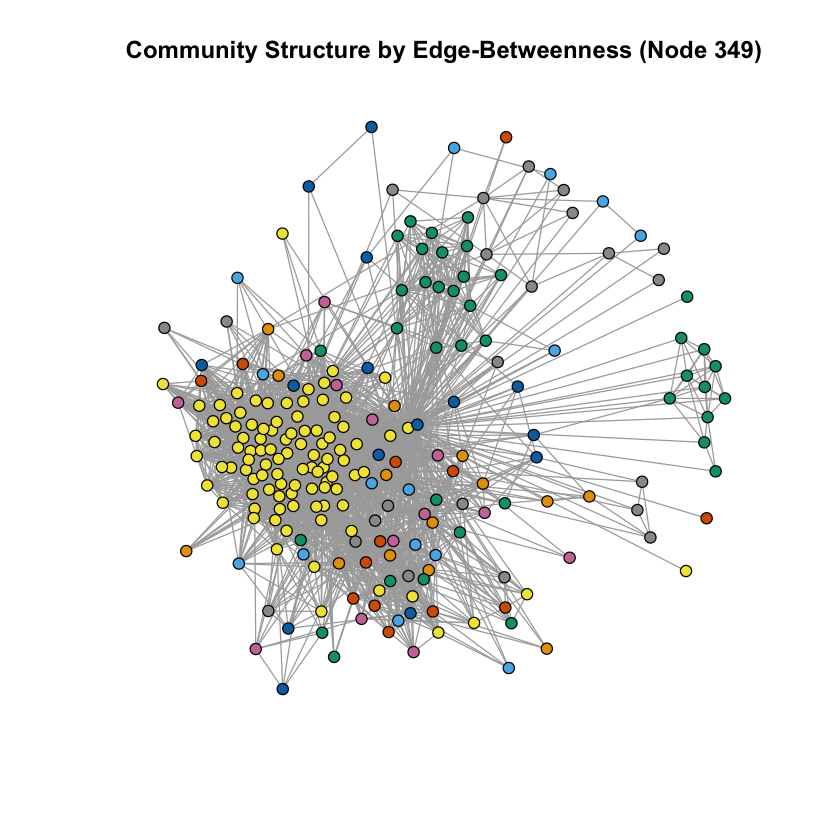

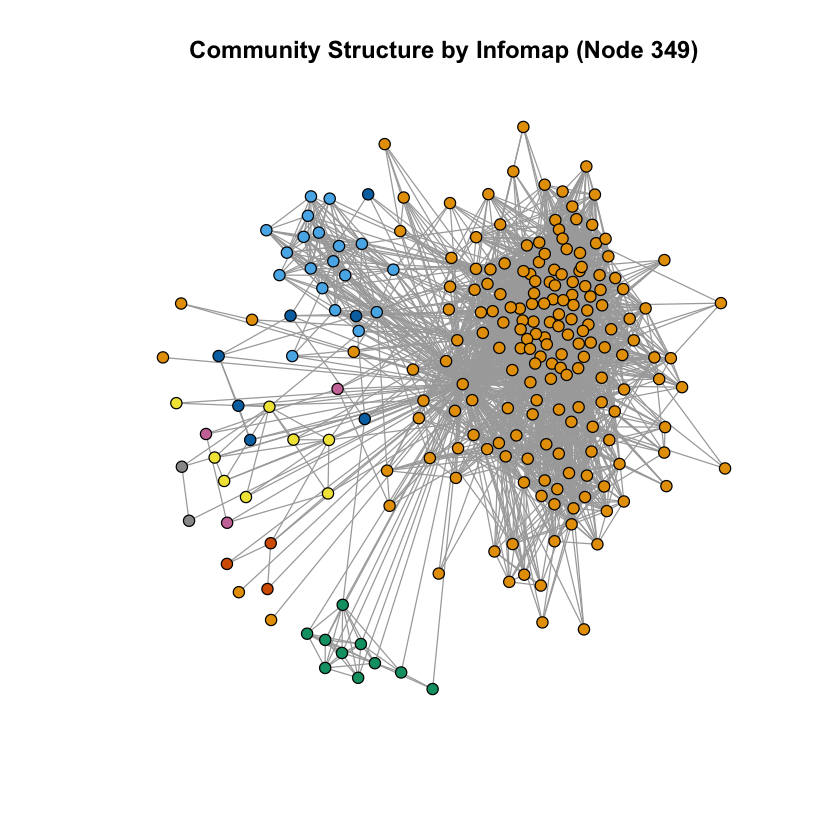

In [5]:
community_detection(induced.subgraph(g, c(349, neighbors(g,349))), 349)

[1] "Modularity score of Fast-Greedy (node 484) is 0.507001642196514."
[1] "Modularity score of Edge-Betweenness (node 484) is 0.489095180244803."
[1] "Modularity score of Infomap (node 484) is 0.515278752174842."


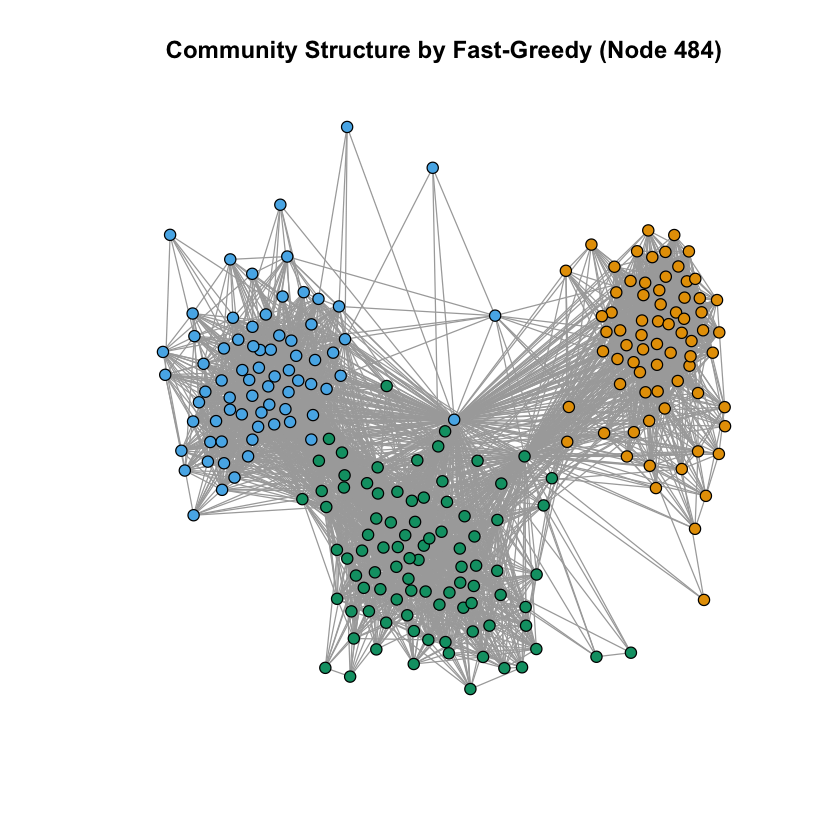

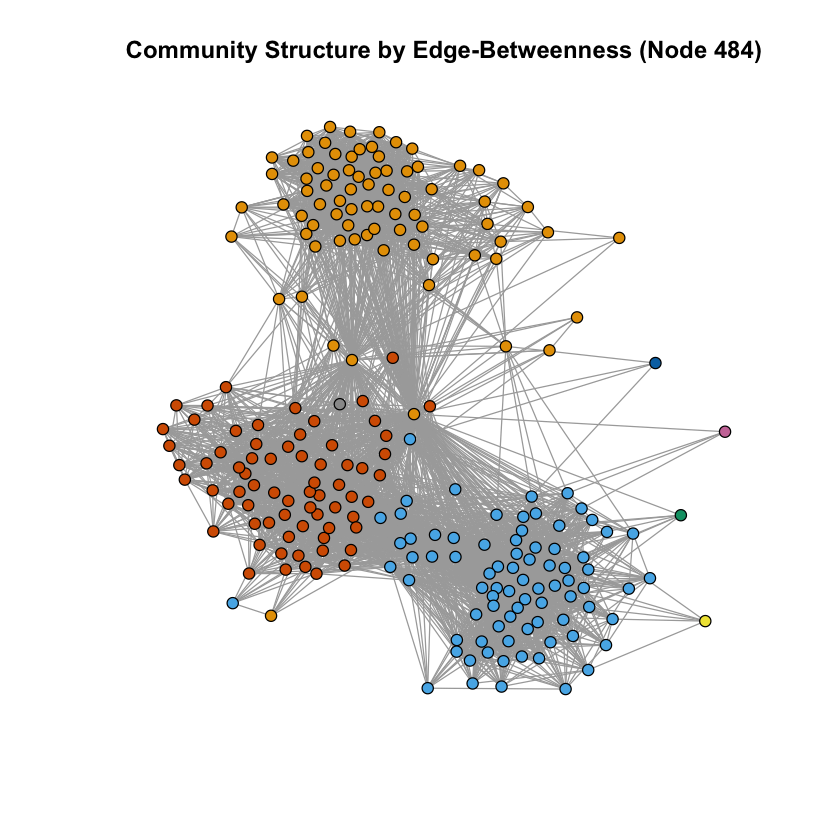

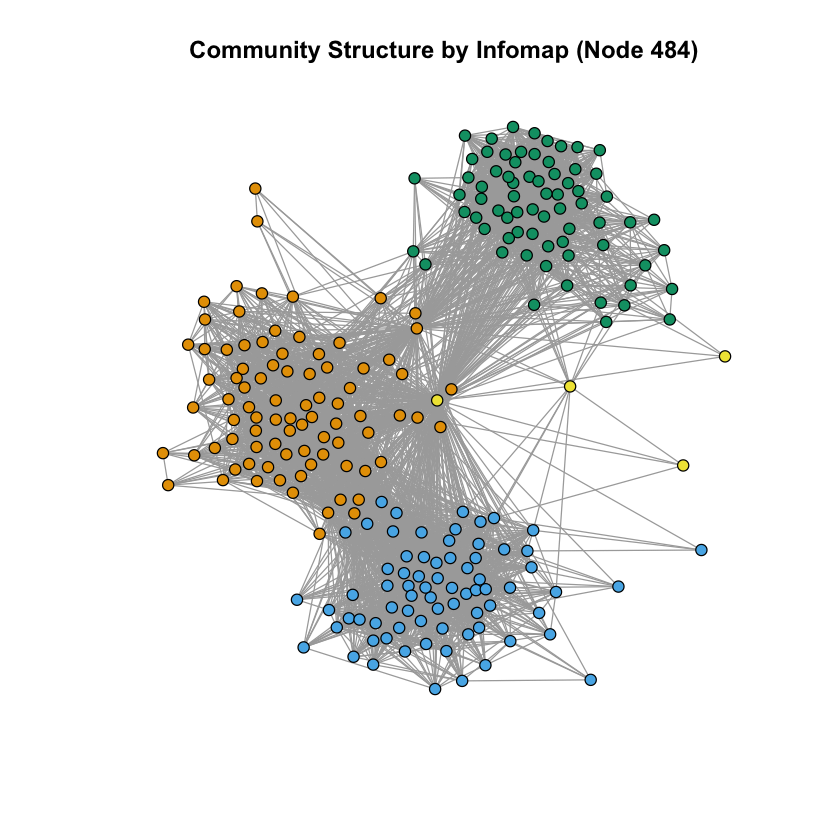

In [11]:
community_detection(induced.subgraph(g, c(484, neighbors(g,484))), 484)

[1] "Modularity score of Fast-Greedy (node 1087) is 0.145531499565493."
[1] "Modularity score of Edge-Betweenness (node 1087) is 0.027623772388464."
[1] "Modularity score of Infomap (node 1087) is 0.0269066172233357."


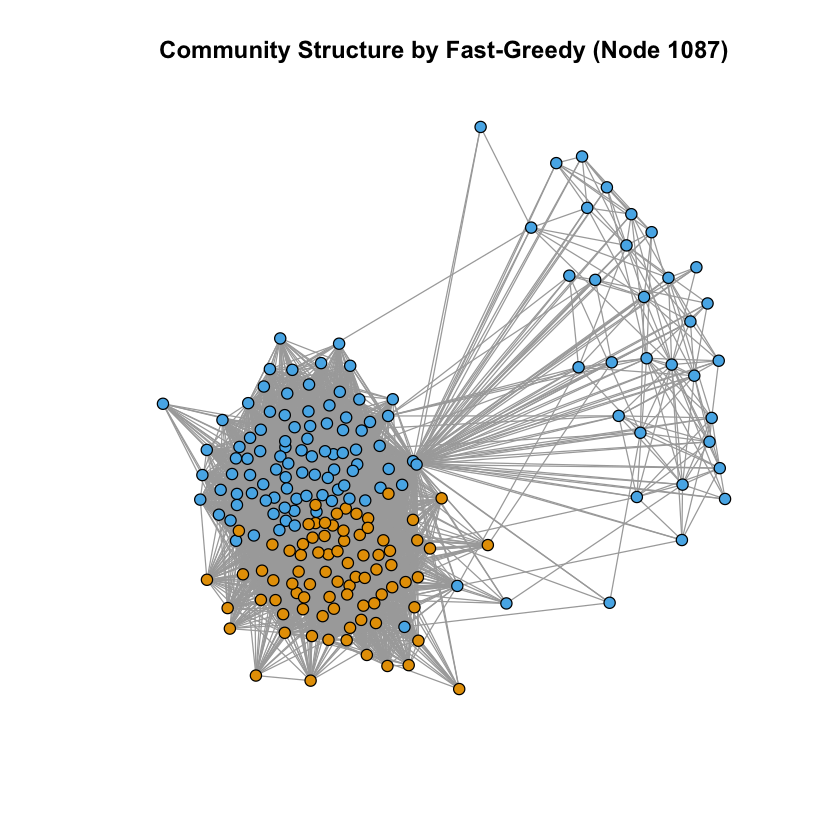

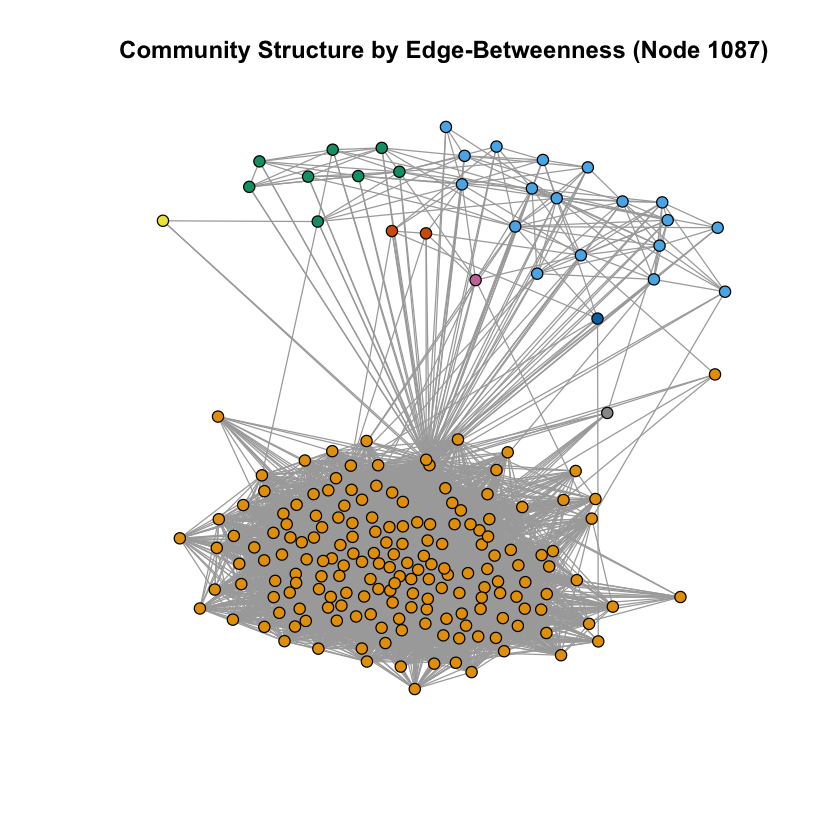

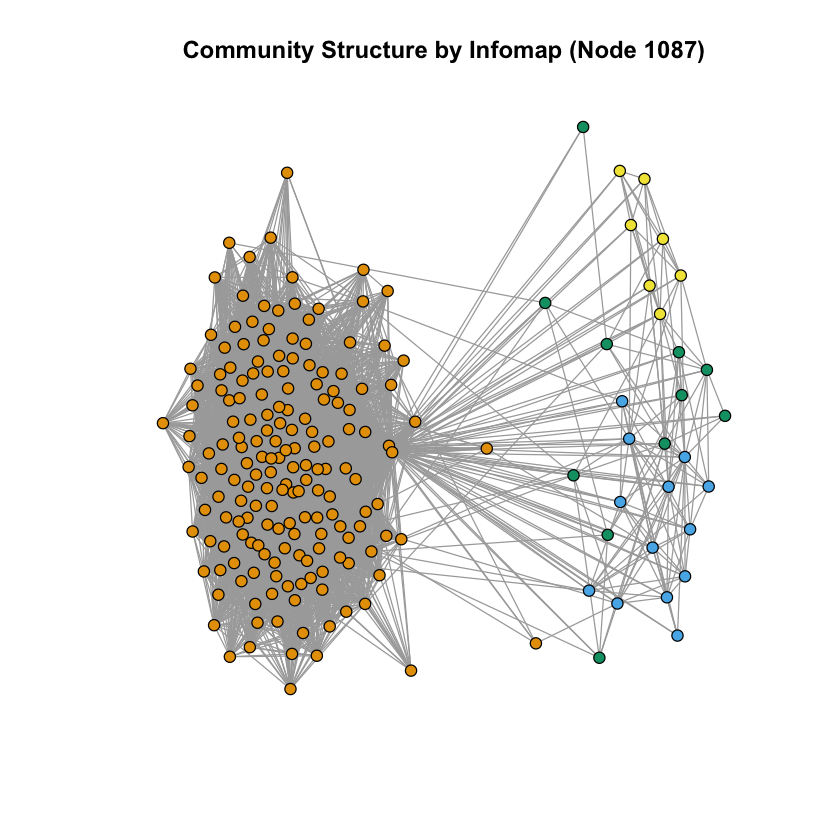

In [12]:
community_detection(induced.subgraph(g, c(1087, neighbors(g,1087))), 1087)

### Q10: Modified personalized network community detection

[1] "Modularity score of Fast-Greedy (node 1) is 0.44185326886839."
[1] "Modularity score of Edge-Betweenness (node 1) is 0.41614614203983."
[1] "Modularity score of Infomap (node 1) is 0.418007659453891."


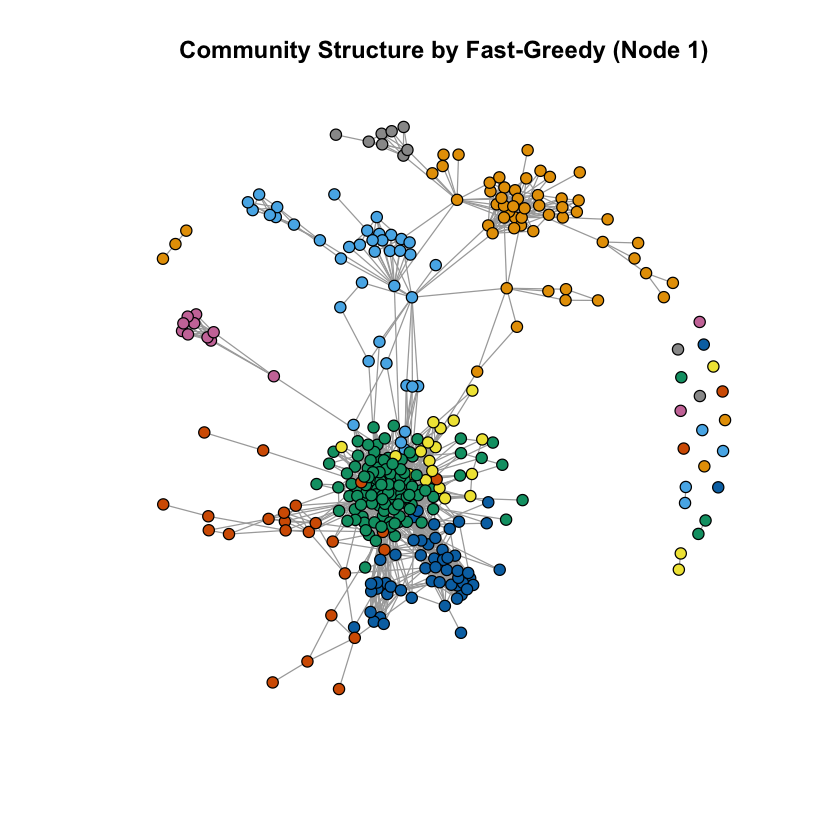

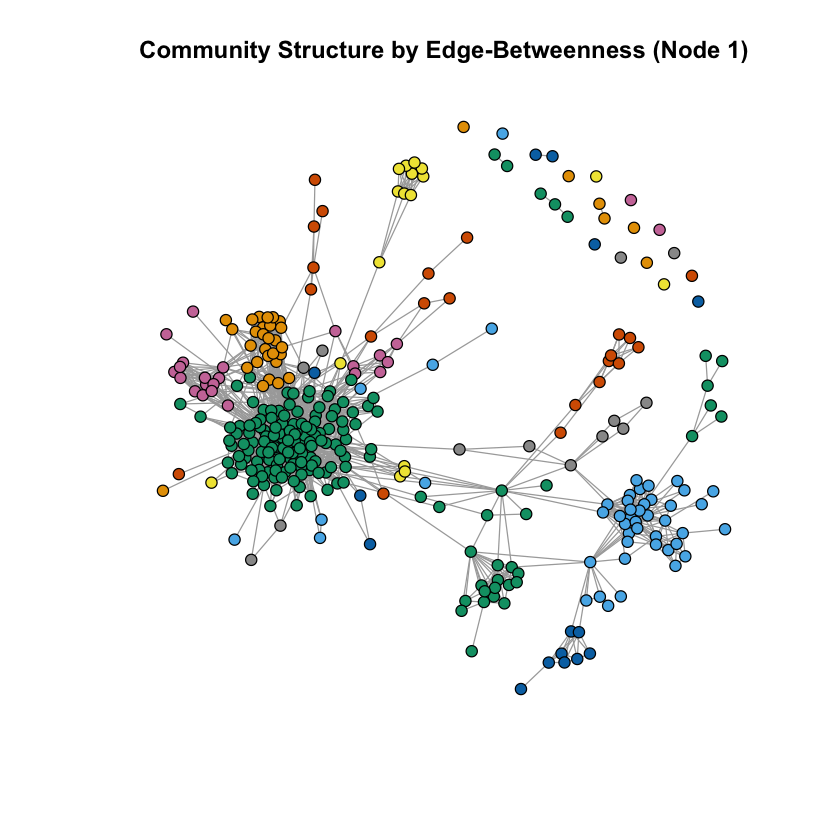

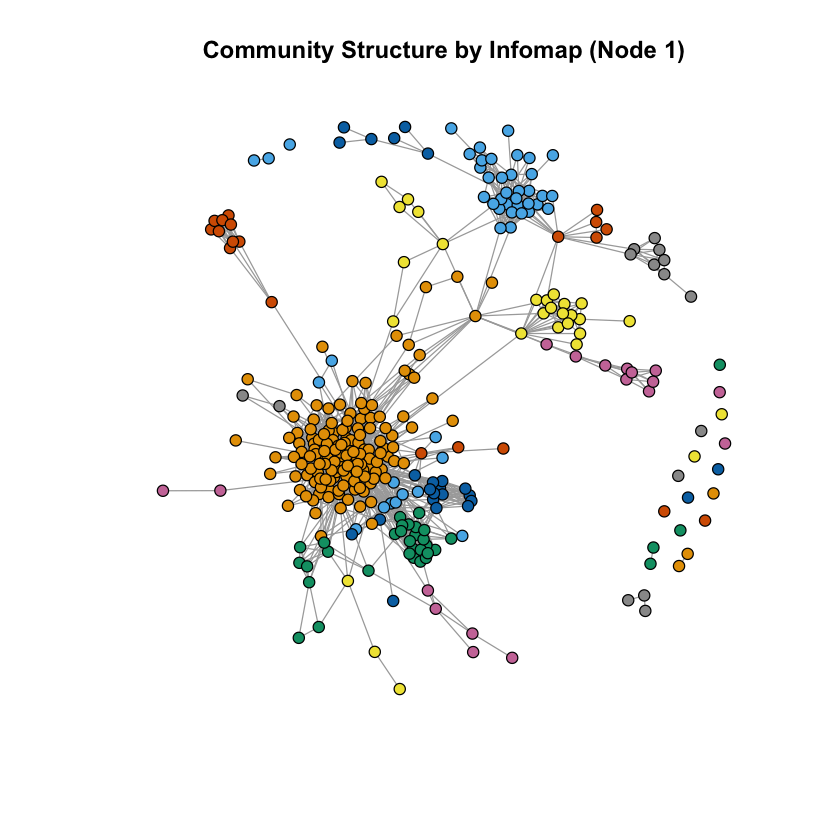

In [16]:
community_detection(induced.subgraph(g, neighbors(g,1)), 1)

[1] "Modularity score of Fast-Greedy (node 108) is 0.458127093719977."
[1] "Modularity score of Edge-Betweenness (node 108) is 0.521321576382217."
[1] "Modularity score of Infomap (node 108) is 0.520209473665822."


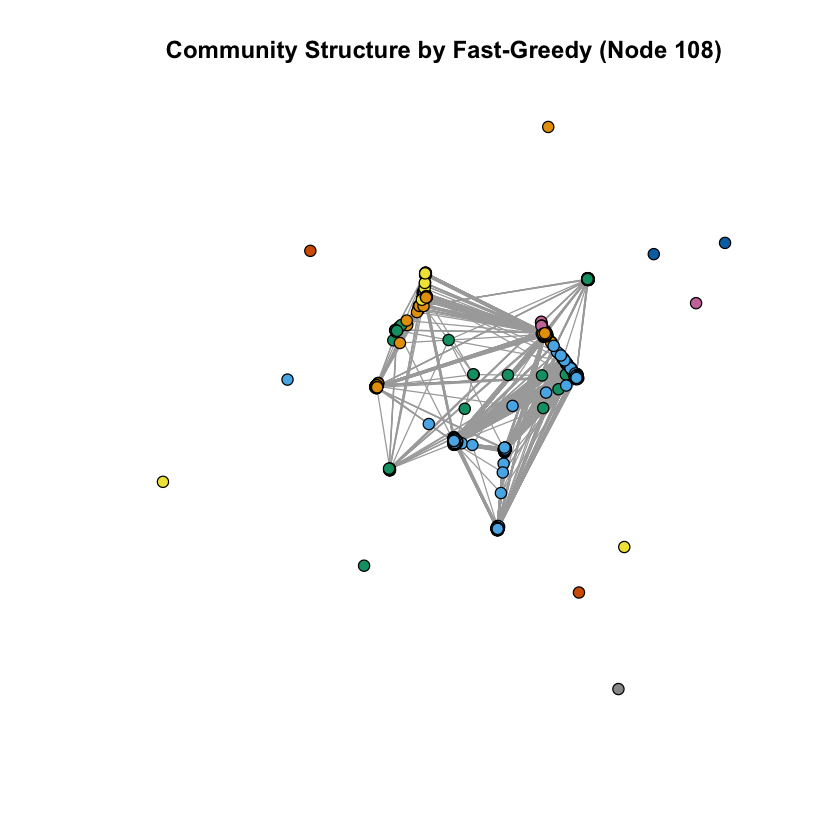

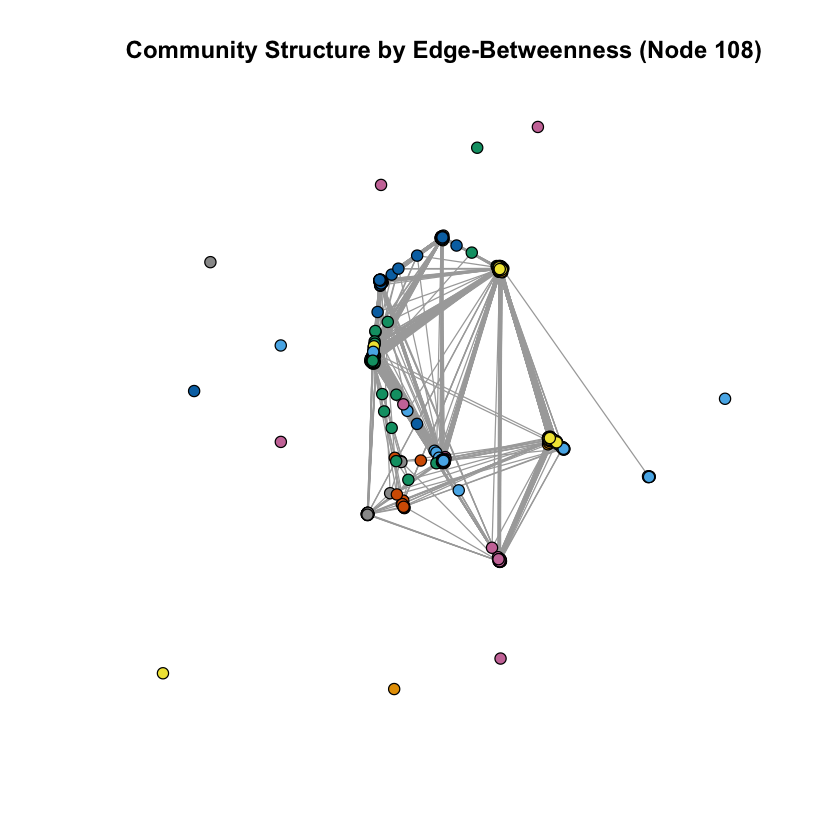

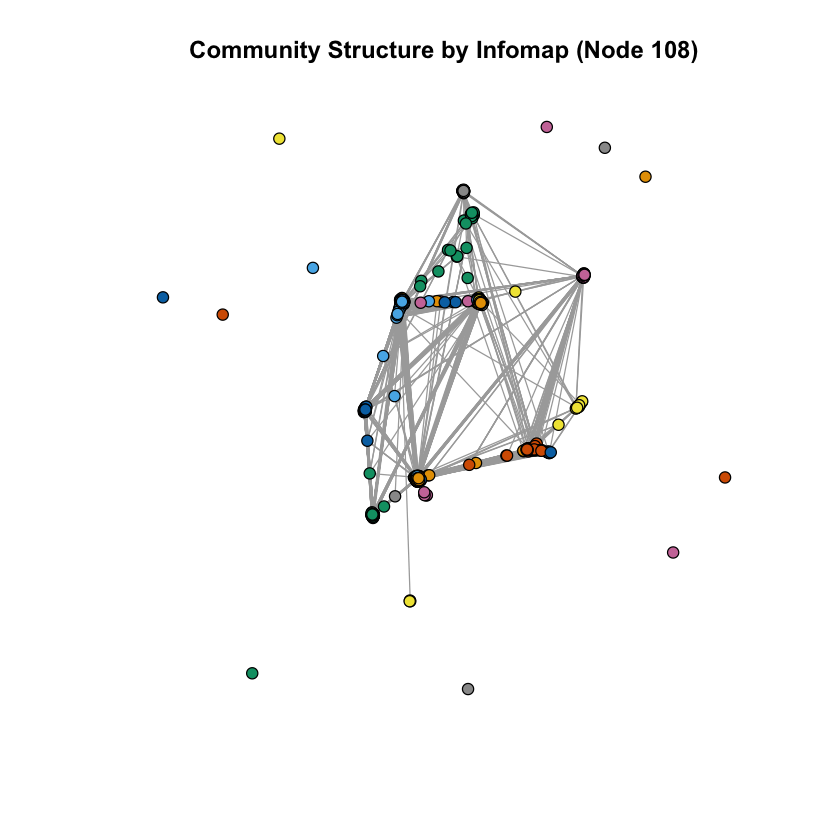

In [17]:
community_detection(induced.subgraph(g, neighbors(g,108)), 108)

[1] "Modularity score of Fast-Greedy (node 349) is 0.245691795942674."
[1] "Modularity score of Edge-Betweenness (node 349) is 0.150566340187559."
[1] "Modularity score of Infomap (node 349) is 0.244815615942085."


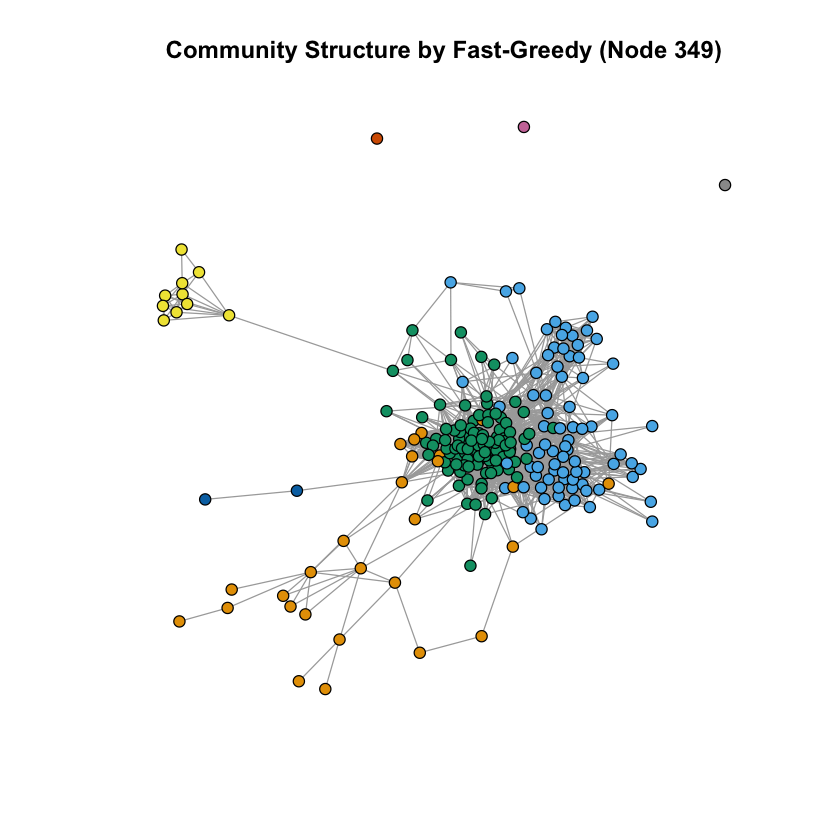

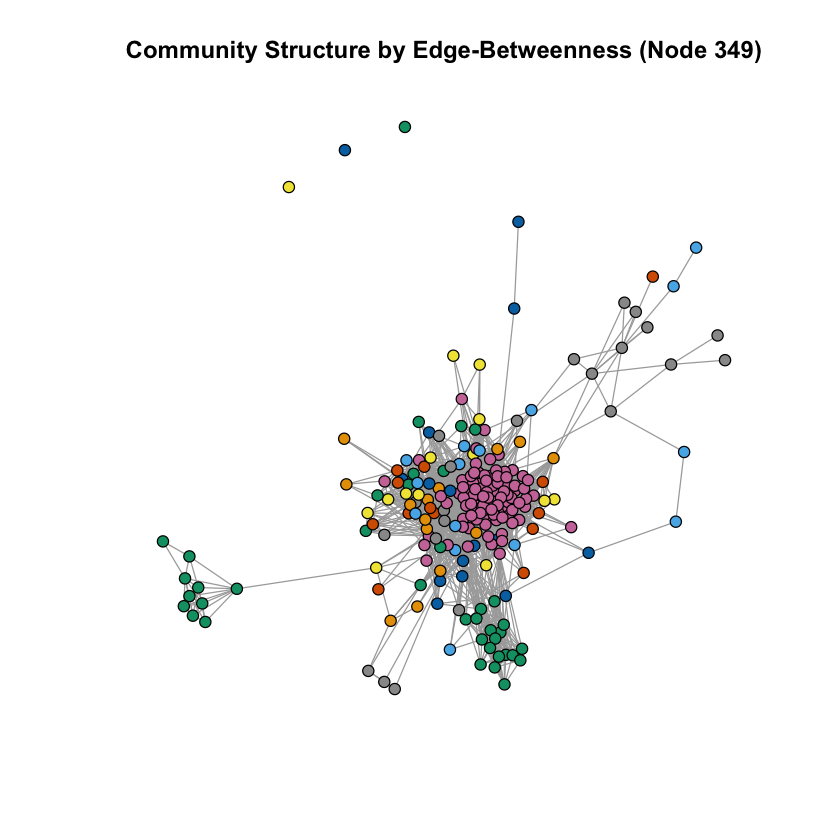

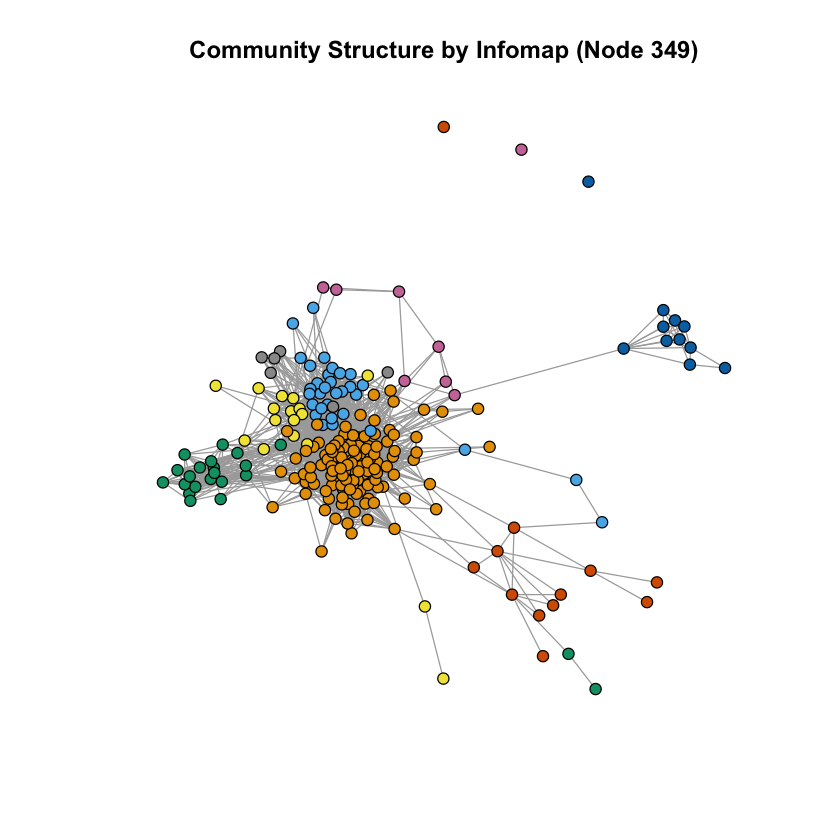

In [15]:
community_detection(induced.subgraph(g, neighbors(g,349)), 349)

[1] "Modularity score of Fast-Greedy (node 484) is 0.534214154606172."
[1] "Modularity score of Edge-Betweenness (node 484) is 0.515441277123504."
[1] "Modularity score of Infomap (node 484) is 0.543443679279522."


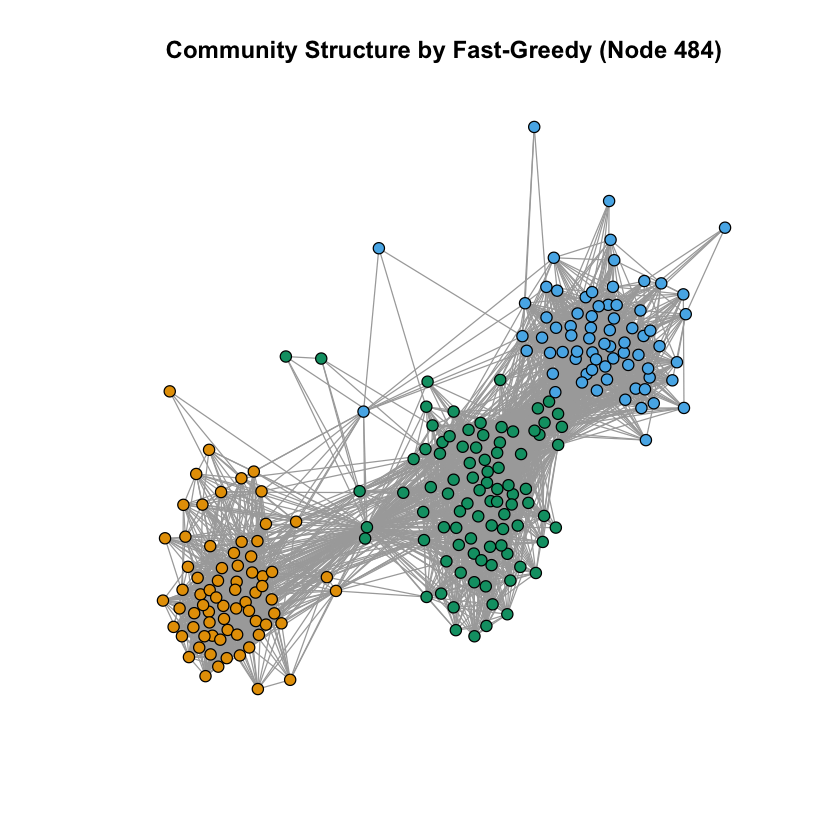

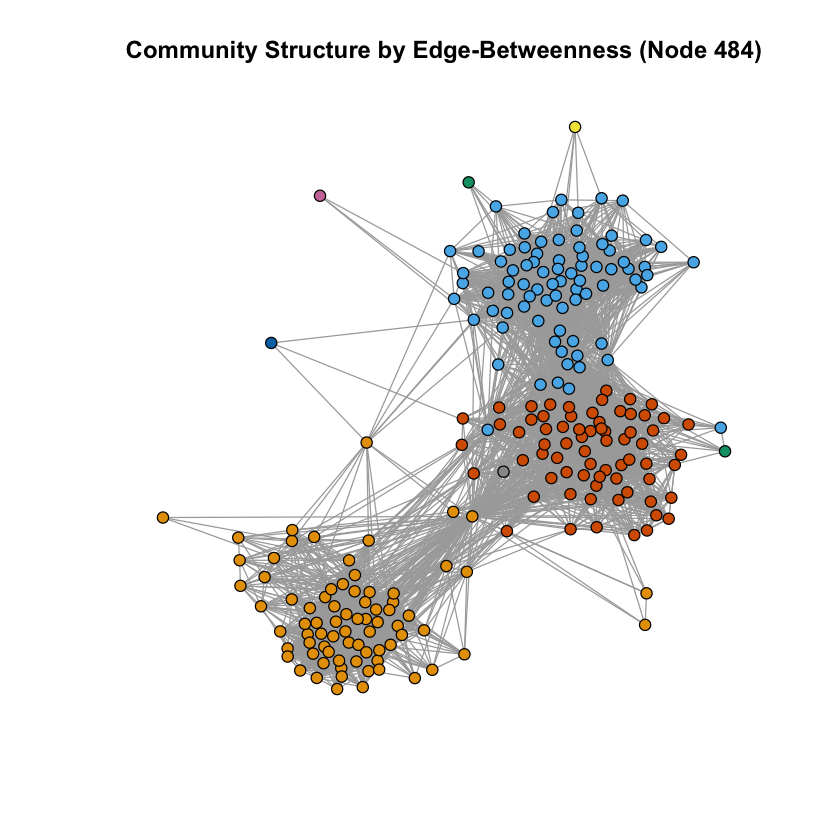

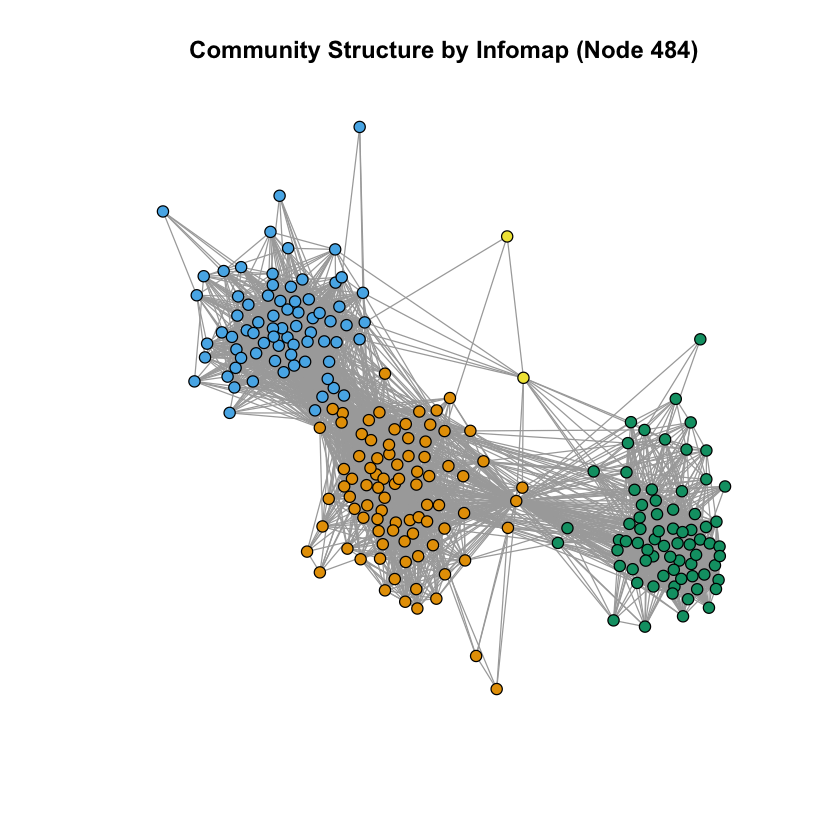

In [14]:
community_detection(induced.subgraph(g, neighbors(g,484)), 484)

[1] "Modularity score of Fast-Greedy (node 1087) is 0.148195631953499."
[1] "Modularity score of Edge-Betweenness (node 1087) is 0.0324952980499142."
[1] "Modularity score of Infomap (node 1087) is 0.0273715944871148."


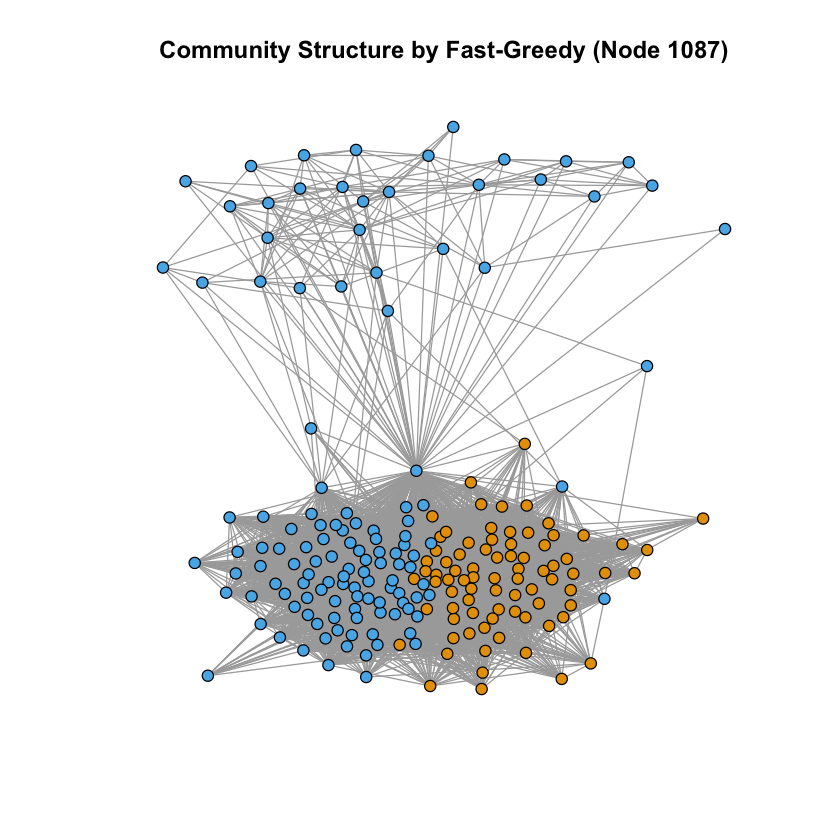

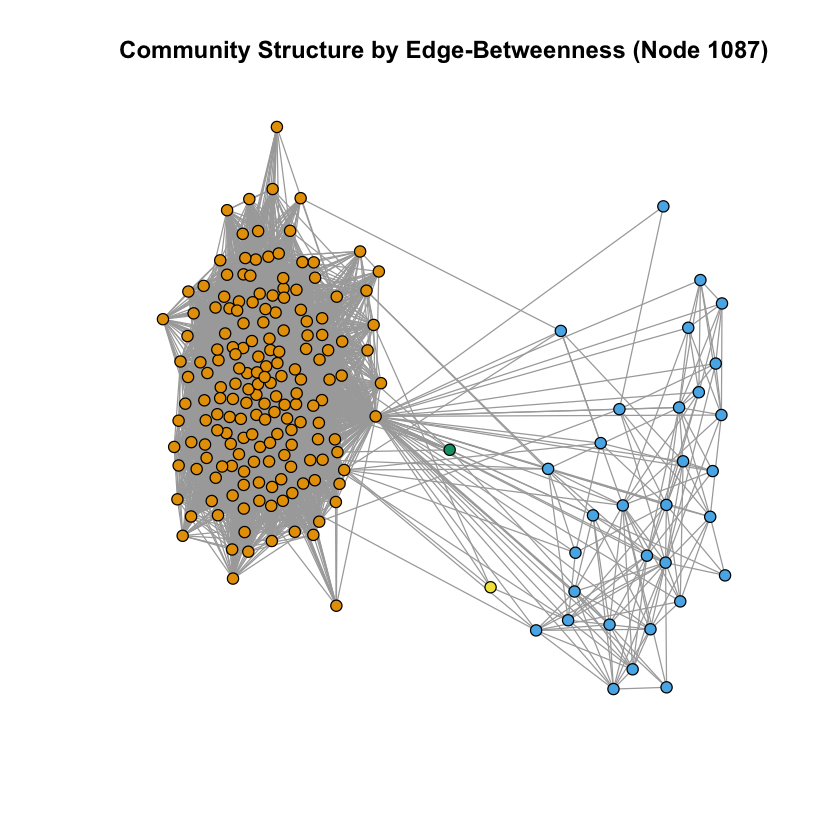

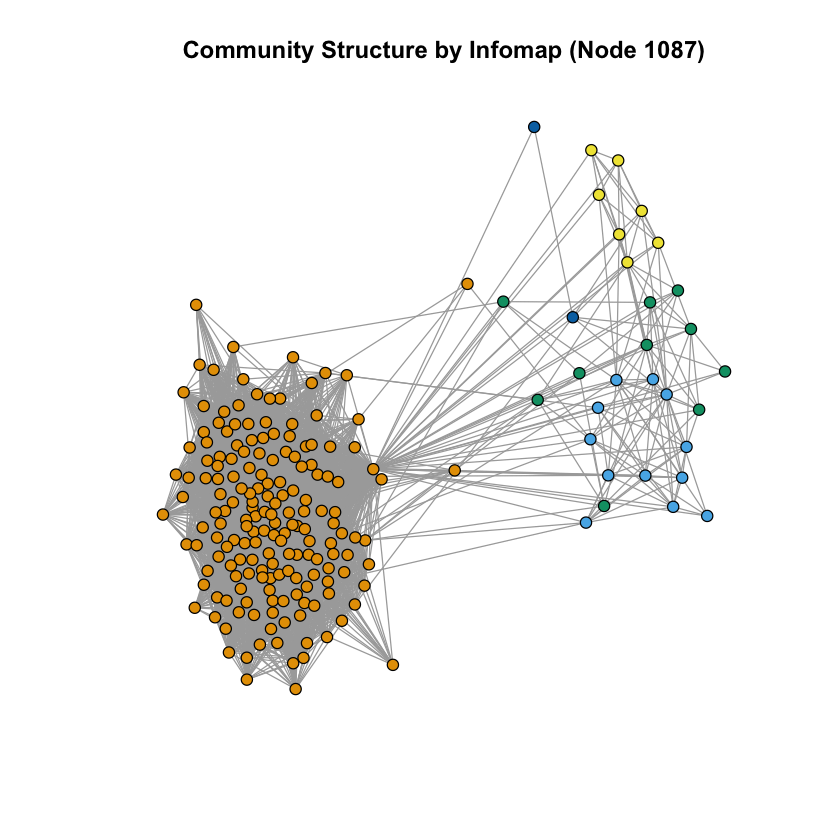

In [13]:
community_detection(induced.subgraph(g, neighbors(g,1087)), 1087)

Question 11

In [58]:
embeddness_dispersion = function(id, g) {
    g1 = induced.subgraph(g, c(id, neighbors(g,id)))
    embeddedness = numeric(0)
    dispersion = numeric(0)
    corenode_neighbors = neighbors(g, id)
    for(i in 1:length(corenode_neighbors)){
        embeddedness = c(embeddedness, length(intersect(corenode_neighbors, neighbors(g, corenode_neighbors[i]))))
    }
    for(i in 1:length(corenode_neighbors)){
        common_friends = intersect(corenode_neighbors, neighbors(g, corenode_neighbors[i]))
        sub_graph = delete.vertices(g1,c(which(V(g1)$name == id), which(V(g1)$name==corenode_neighbors[i])))
        dist = numeric(0)
        for(j in 1:length(common_friends)){
            for(k in (j + 1):length(common_friends)){
                #dist = c(dist, shortest.paths(sub_graph,which(V(sub_graph)$name == common_friends[j]),which(V(sub_graph)$name == common_friends[k])))
                sp = distances(sub_graph,which(V(sub_graph)$name == common_friends[j]),which(V(sub_graph)$name == common_friends[k])) 
                if(length(sp) == 0 || is.infinite(sp)){sp = d + constant}
                dist = c(dist, sp)  
            }
        }
        dispersion = c(dispersion, sum(dist))
    }
    hist(embeddedness,breaks=50,main = "Embeddedness Distribution",xlab = "Embeddedness")
    hist(dispersion[which(dispersion!=Inf)],breaks = 50,main = "Dispersion Distribution",xlab = "Dispersion")
    community_g = fastgreedy.community(g1)
    color_vec = community_g$membership + 1
    size_vec = rep(3, length(color_vec))
    edge_color = rep("grey", length(E(g1)))
    edge_weight = rep(0.05, length(E(g1)))
    edge_color[which(get.edgelist(g1, name=FALSE)[,1]==max_dispersion_embeddedness|get.edgelist(g1, name=FALSE)[,2]==max_dispersion_embeddedness)] = "red"
    edge_weight[which(get.edgelist(g1, name=FALSE)[,1]==max_dispersion_embeddedness|get.edgelist(g1, name=FALSE)[,2]==max_dispersion_embeddedness)] = 2;
    size_vec[max_dispersion_embeddedness] = 5
    color_vec[max_dispersion_embeddedness] = 7
    plot.igraph(g1, vertex.size = size_vec, vertex.label=NA, edge.width=edge_weight, edge.color=edge_color,vertex.color=color_vec,asp=9/16,main = sprintf("Community Structure with max_dispersion_embeddedness  (Node %s)", id))
    color_vec = community_g$membership + 1
    size_vec = rep(3, length(color_vec))
    edge_color = rep("grey", length(E(g1)))
    edge_weight = rep(0.05, length(E(g1)))
    edge_color[which(get.edgelist(g1, name=FALSE)[,1]==max_embeddedness|get.edgelist(g1, name=FALSE)[,2]==max_embeddedness)] = "red"
    edge_weight[which(get.edgelist(g1, name=FALSE)[,1]==max_embeddedness|get.edgelist(g1, name=FALSE)[,2]==max_embeddedness)] = 2;
    size_vec[max_embeddedness] = 5
    color_vec[max_embeddedness] = 7
    plot.igraph(g1, vertex.size = size_vec, vertex.label=NA, edge.width=edge_weight, edge.color=edge_color,vertex.color=color_vec,asp=9/16,main = sprintf("Community Structure with max_embeddedness  (Node %s)", id))
    color_vec = community_g$membership + 1
    size_vec = rep(3, length(color_vec))
    edge_color = rep("grey", length(E(g1)))
    edge_weight = rep(0.05, length(E(g1)))
    edge_color[which(get.edgelist(g1, name=FALSE)[,1]==max_dispersion|get.edgelist(g1, name=FALSE)[,2]==max_dispersion)] = "red"
    edge_weight[which(get.edgelist(g1, name=FALSE)[,1]==max_dispersion|get.edgelist(g1, name=FALSE)[,2]==max_dispersion)] = 2;
    size_vec[max_dispersion] = 5
    color_vec[max_dispersion] = 7
    plot.igraph(g1, vertex.size = size_vec, vertex.label=NA, edge.width=edge_weight, edge.color=edge_color,vertex.color=color_vec,asp=9/16, main = sprintf("Community Structure with max_dispersion (Node %s)", id))

}

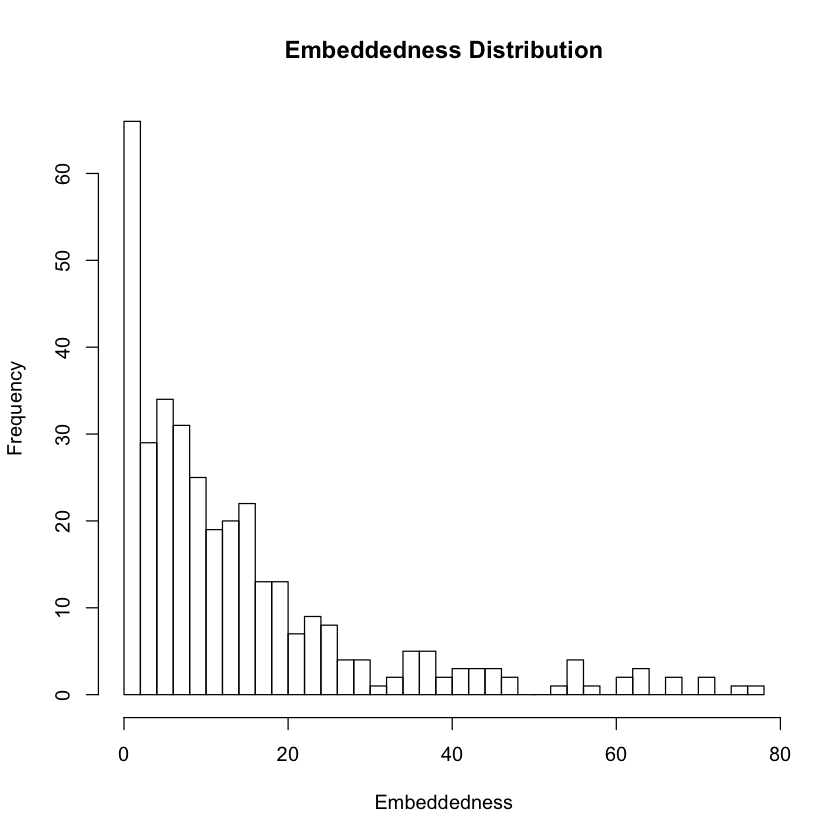

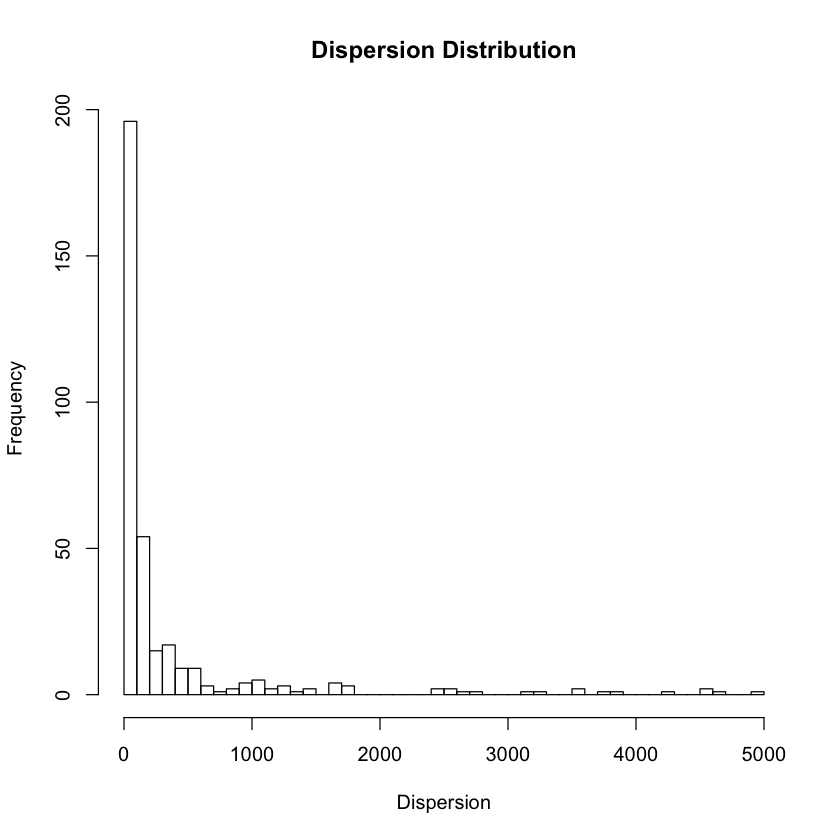

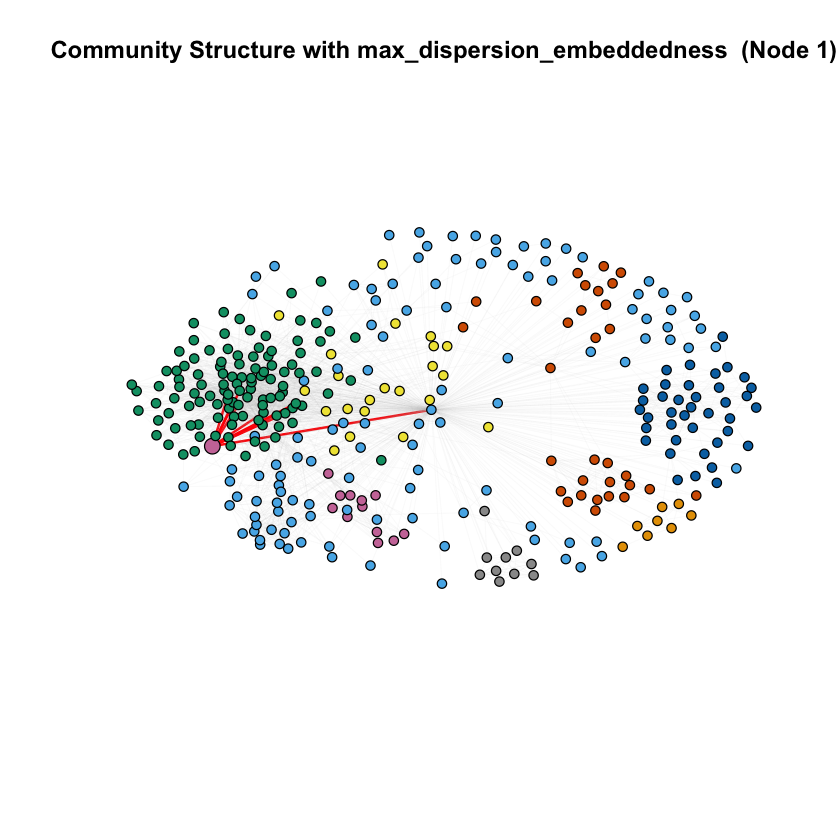

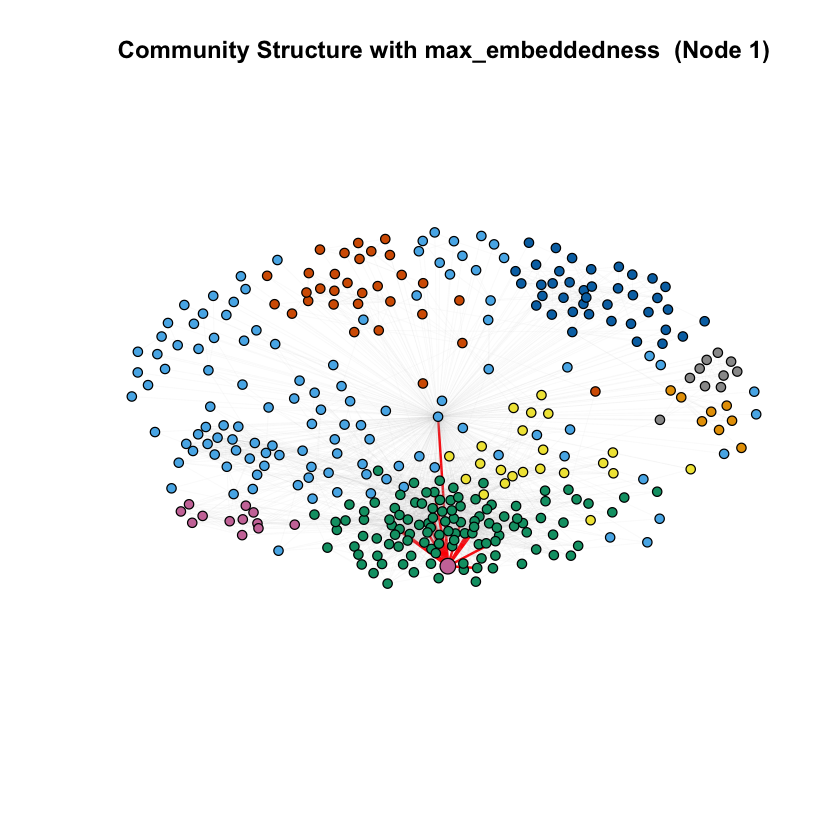

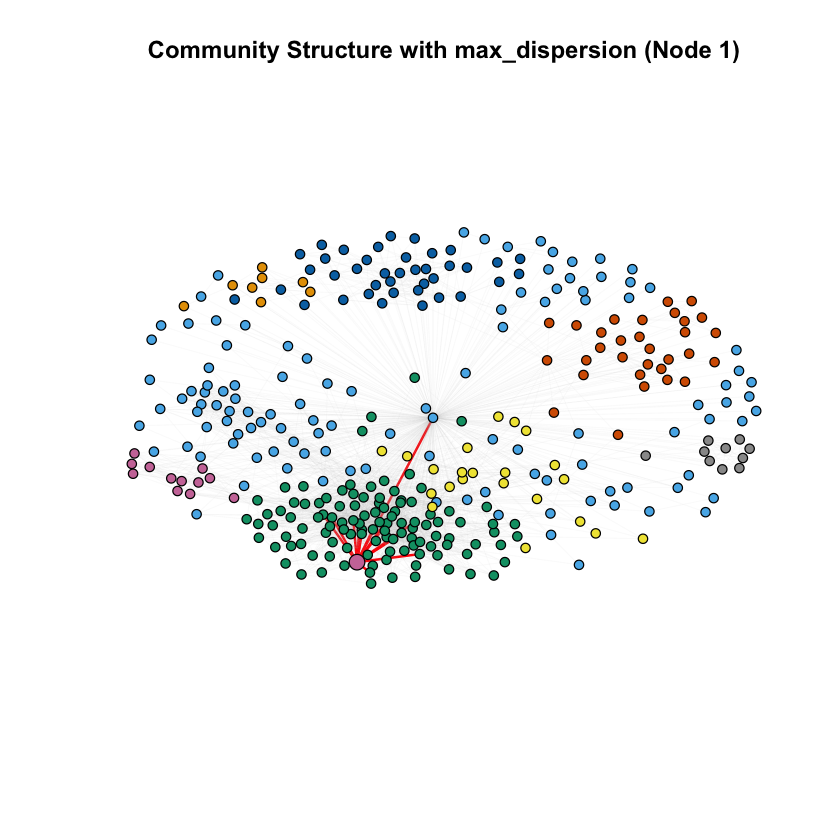

In [59]:
embeddness_dispersion(1,g)

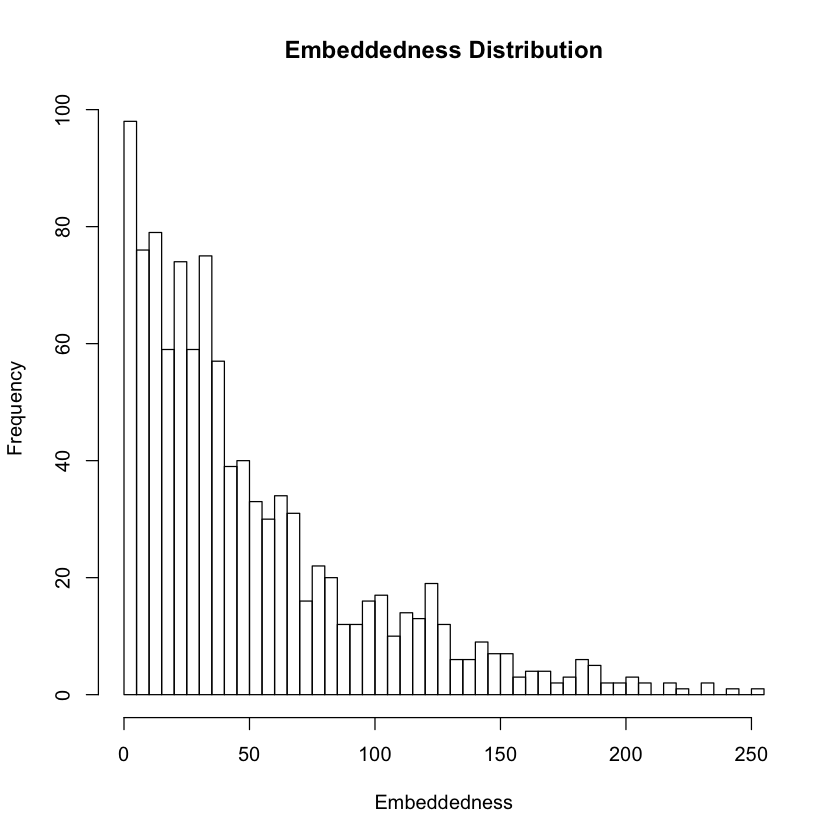

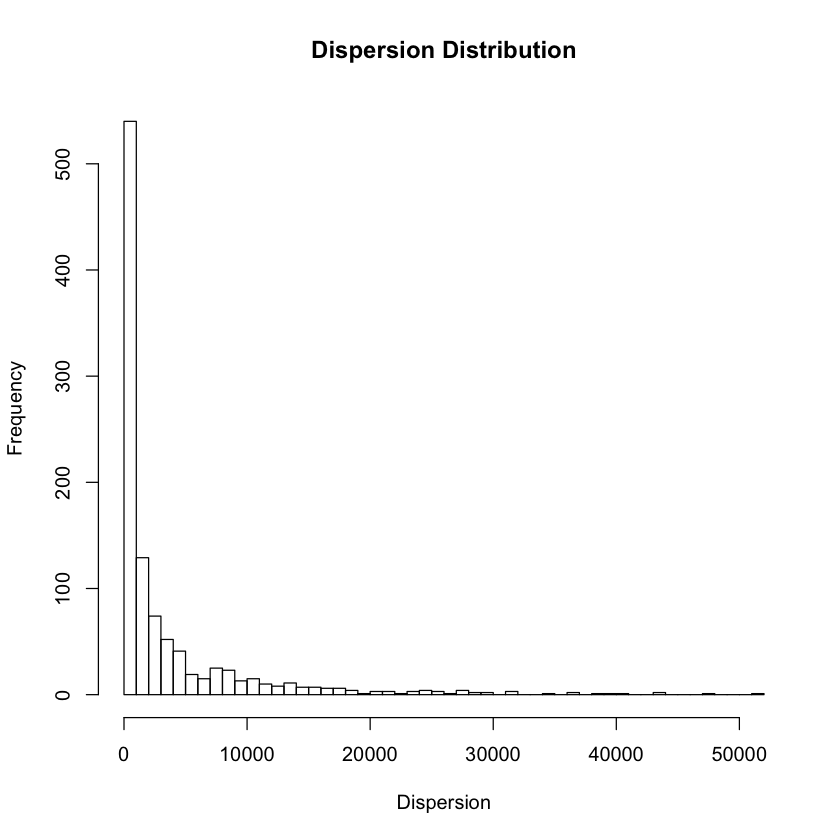

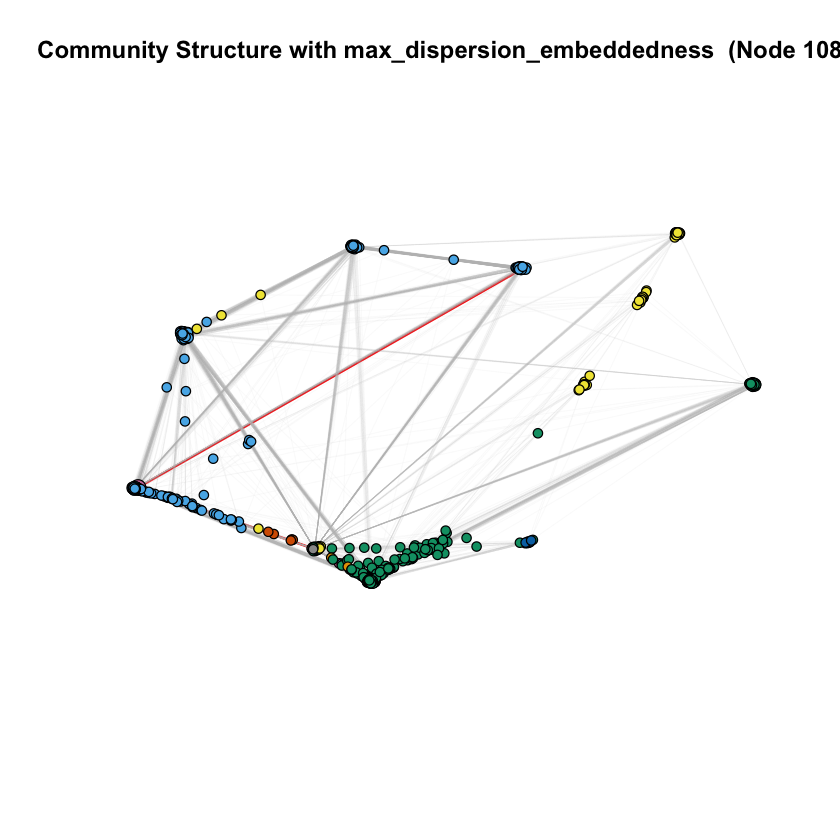

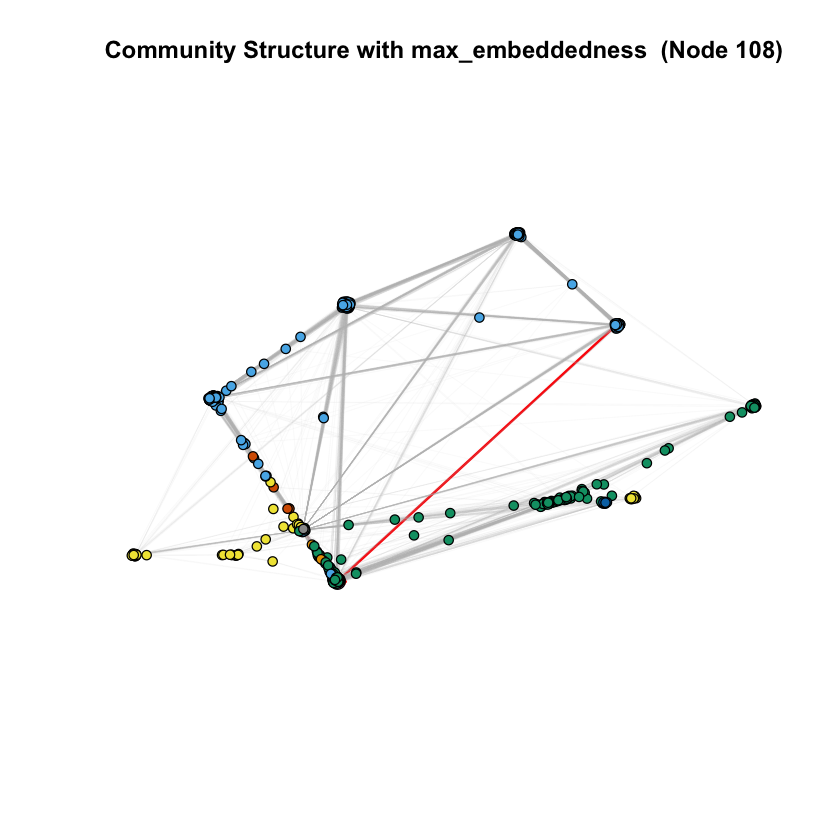

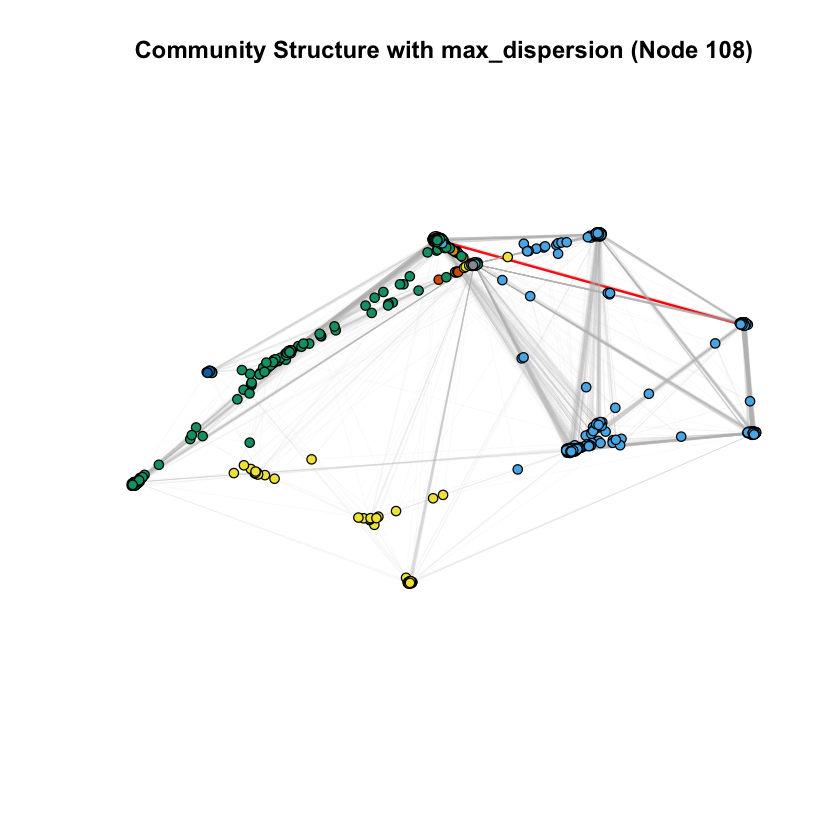

In [69]:
embeddness_dispersion(108,g)

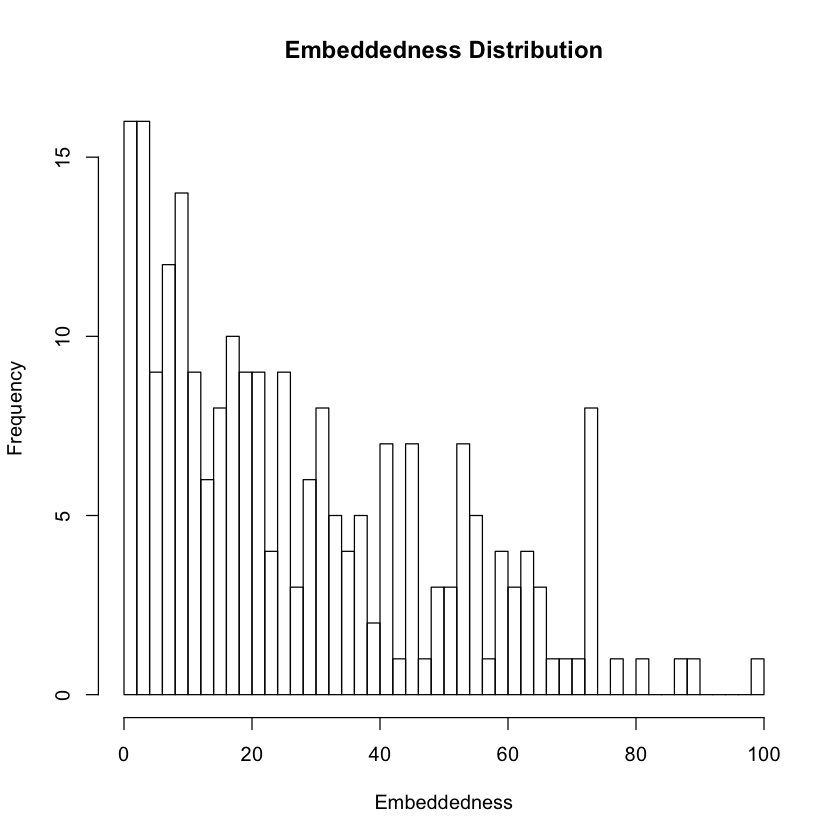

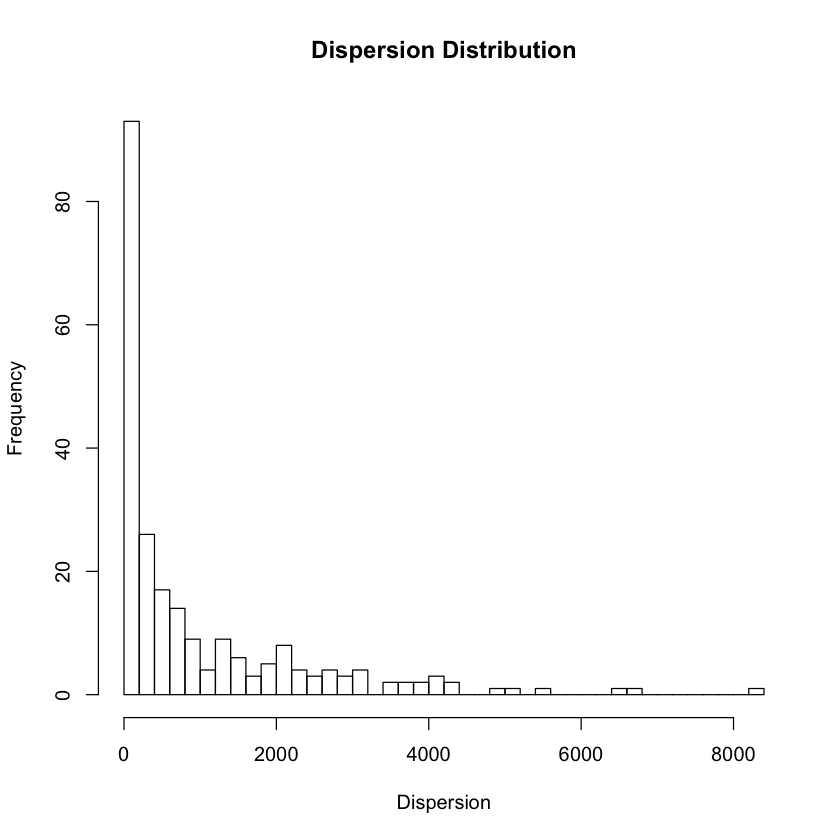

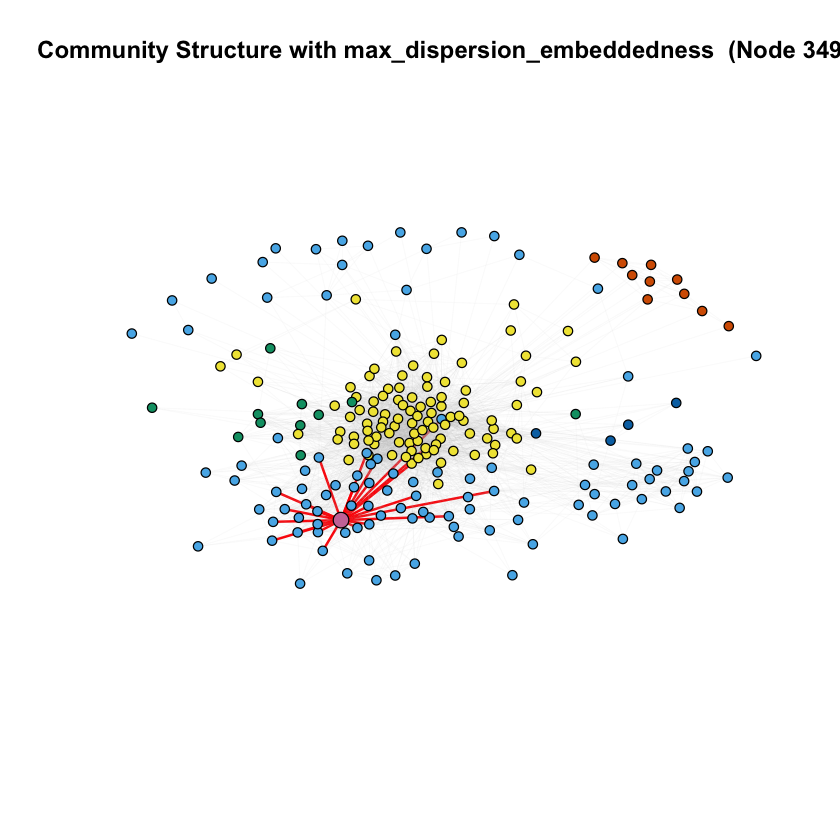

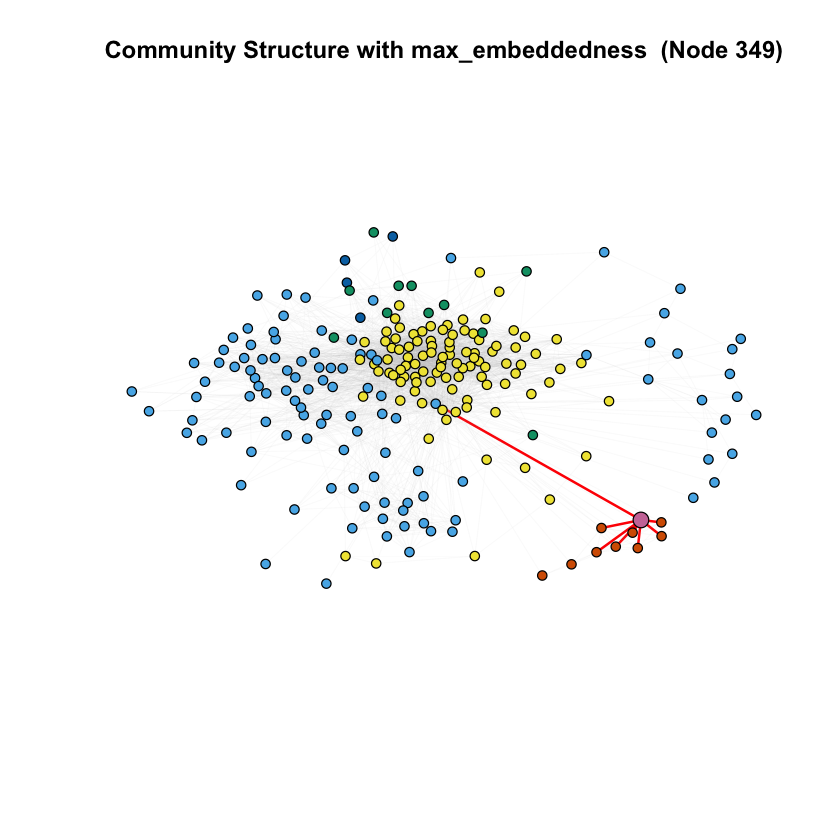

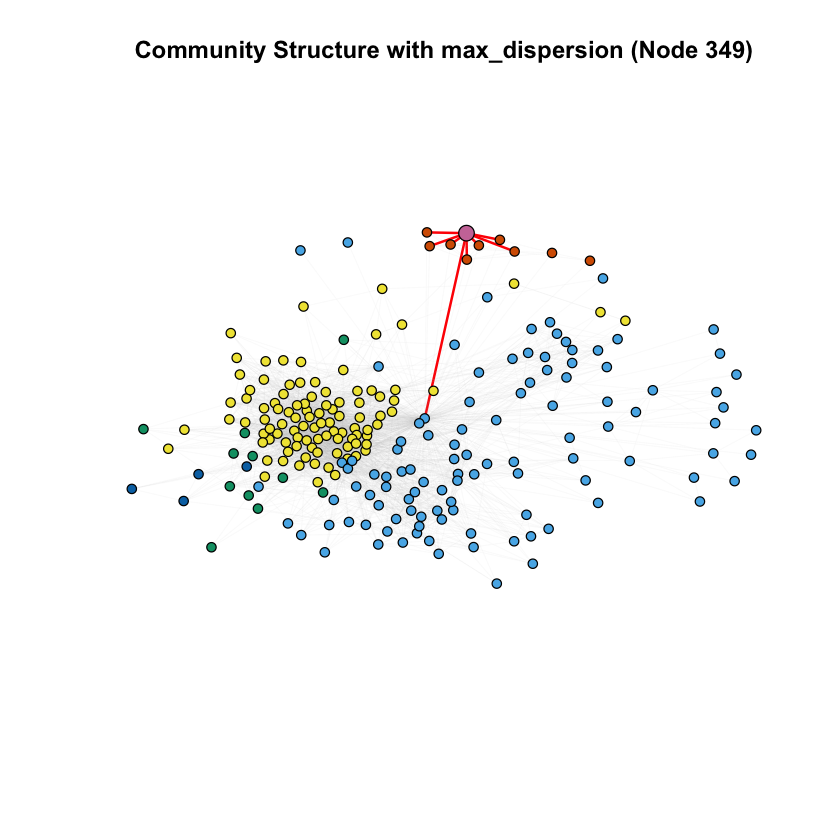

In [66]:
embeddness_dispersion(349,g)

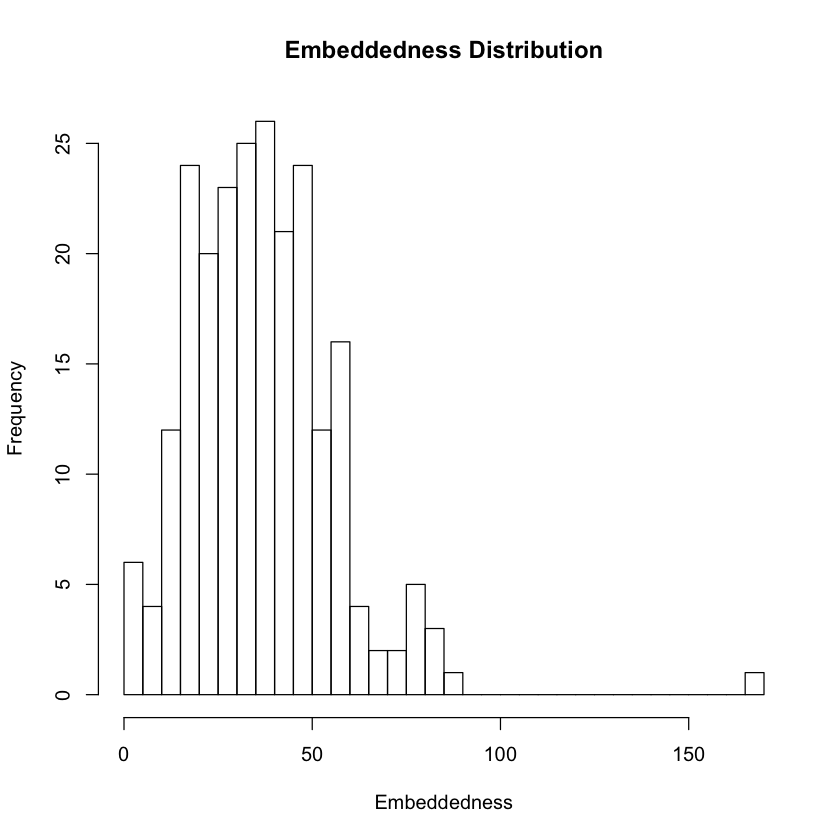

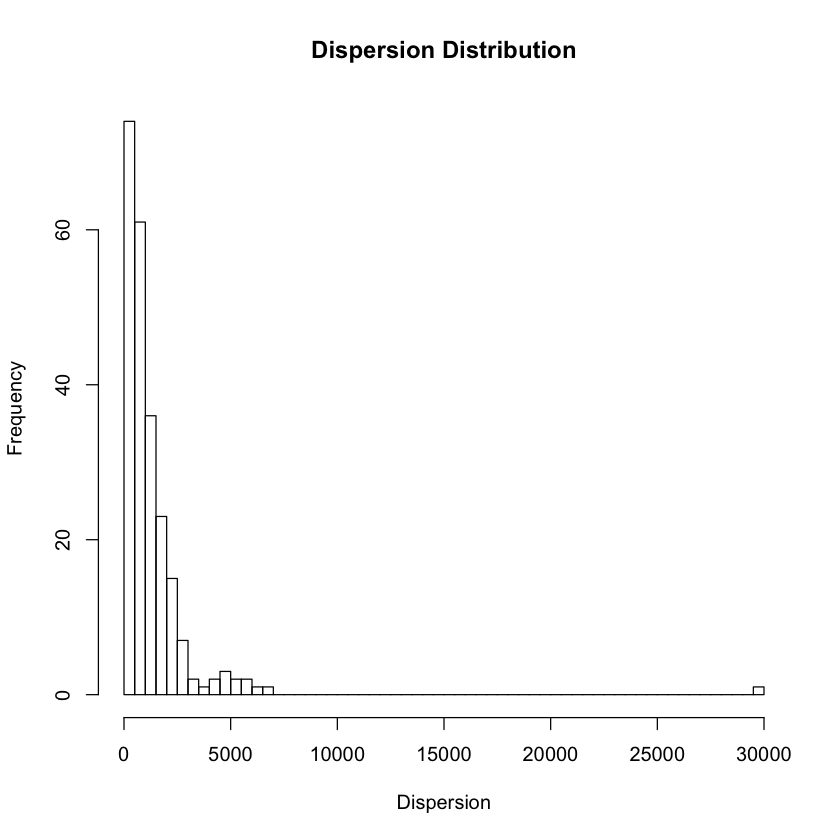

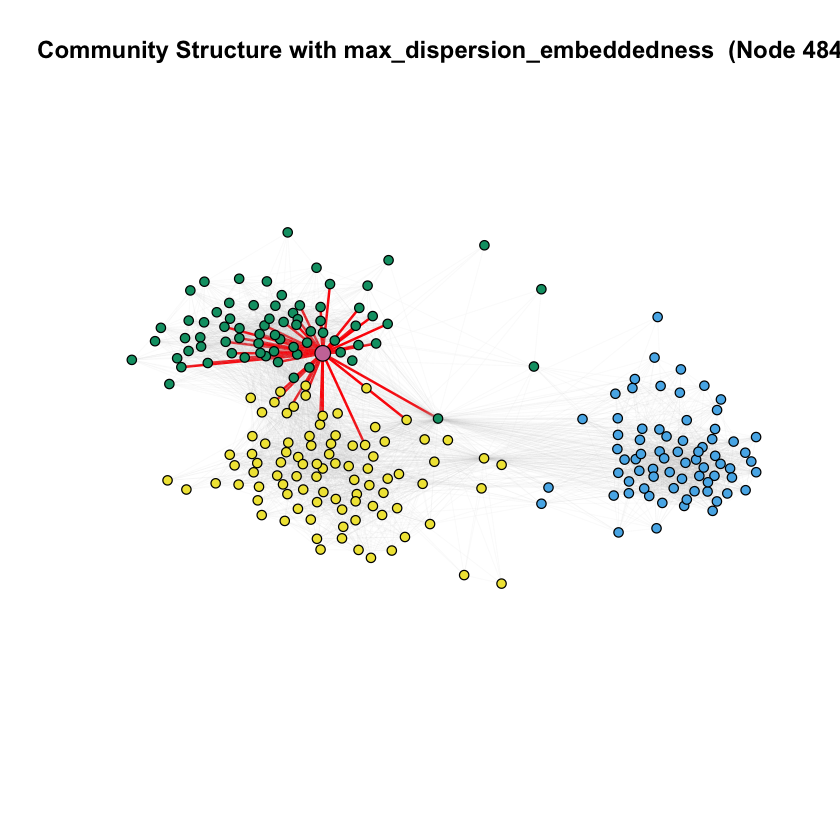

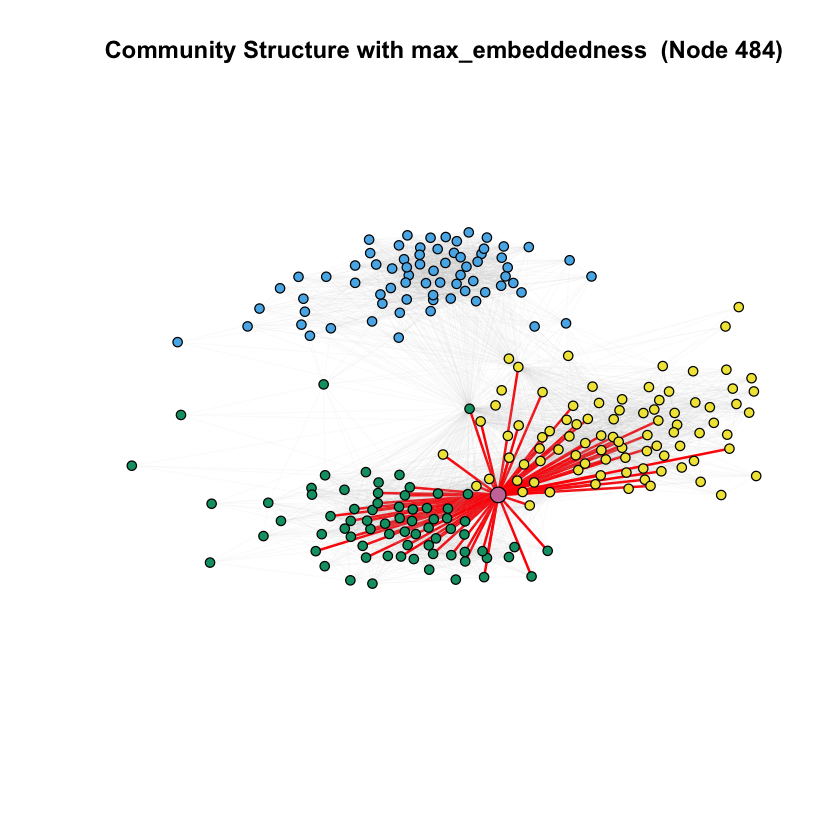

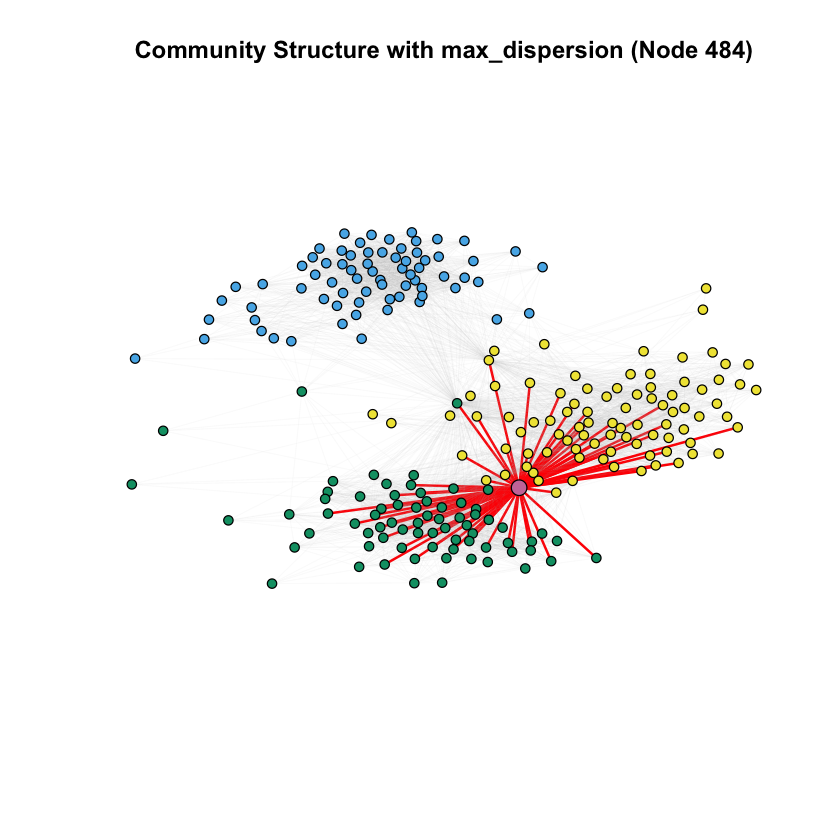

In [67]:
embeddness_dispersion(484,g)

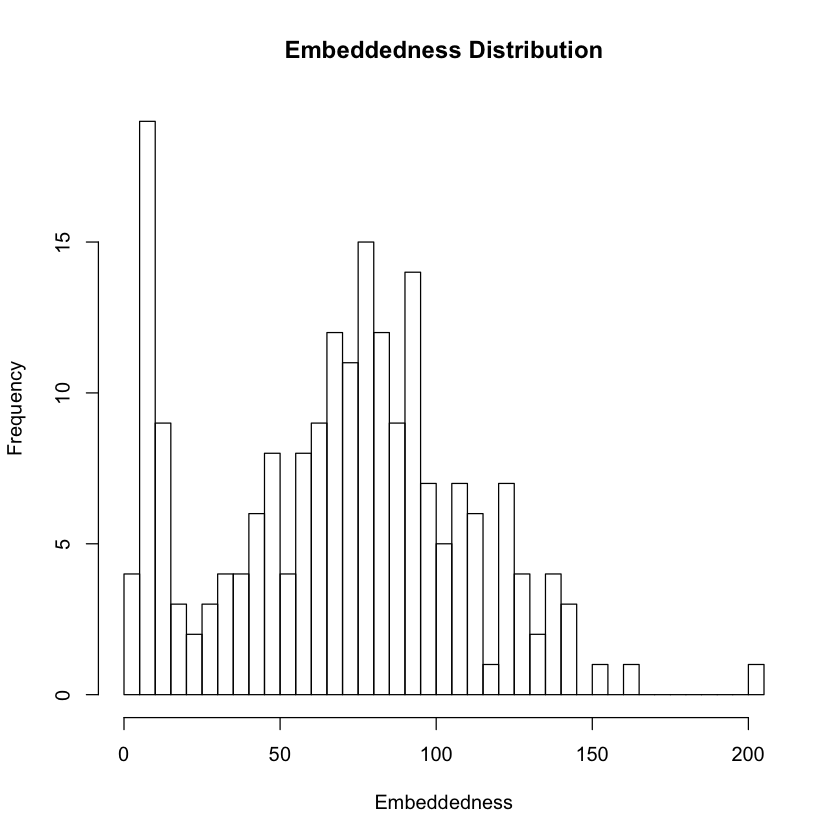

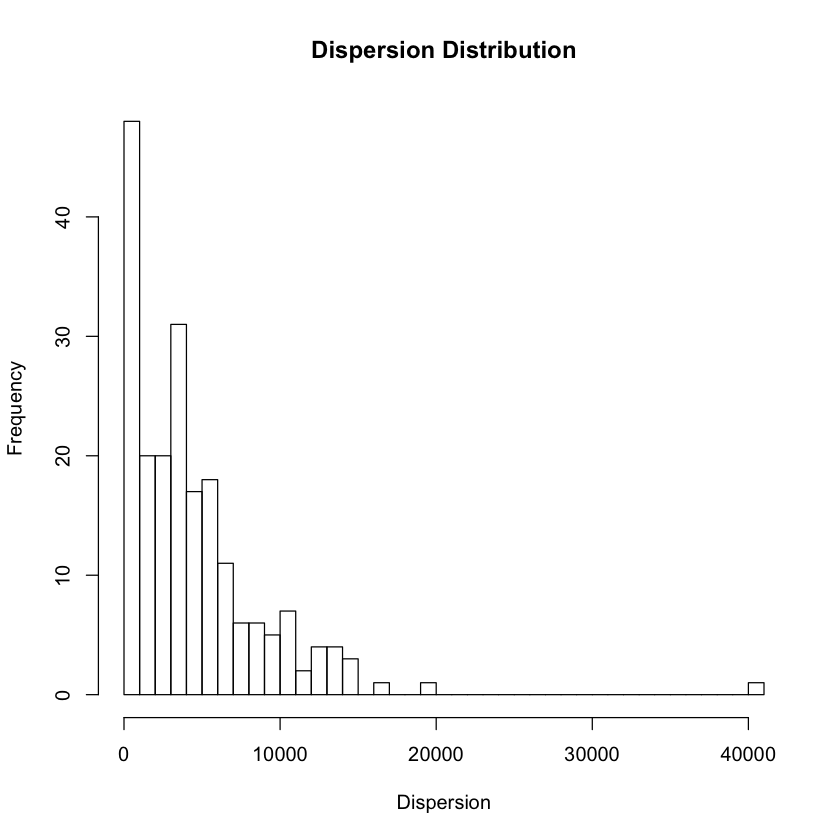

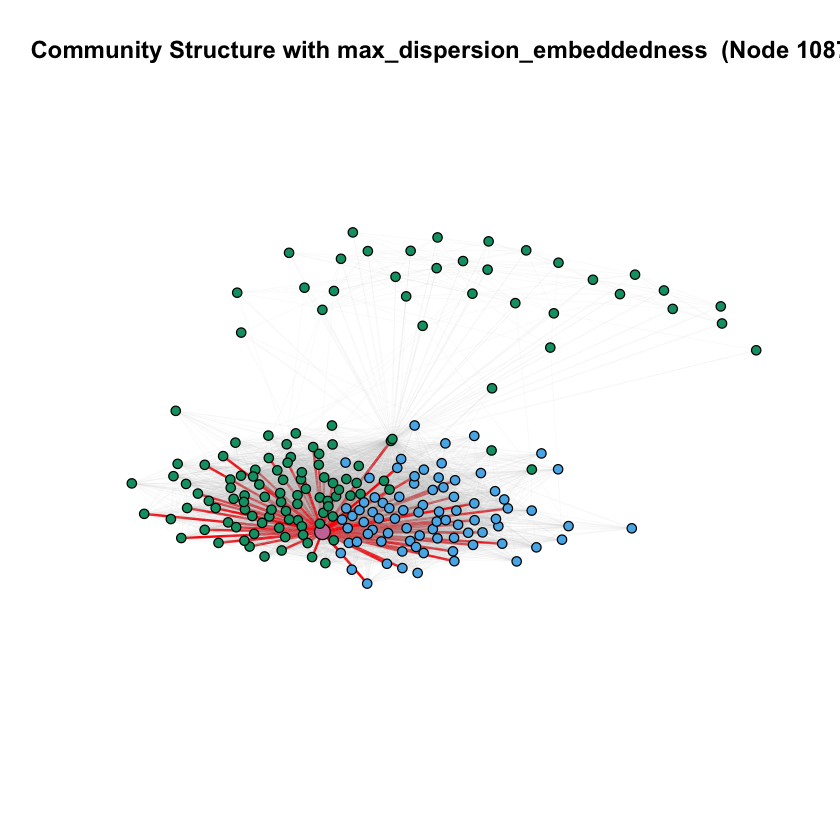

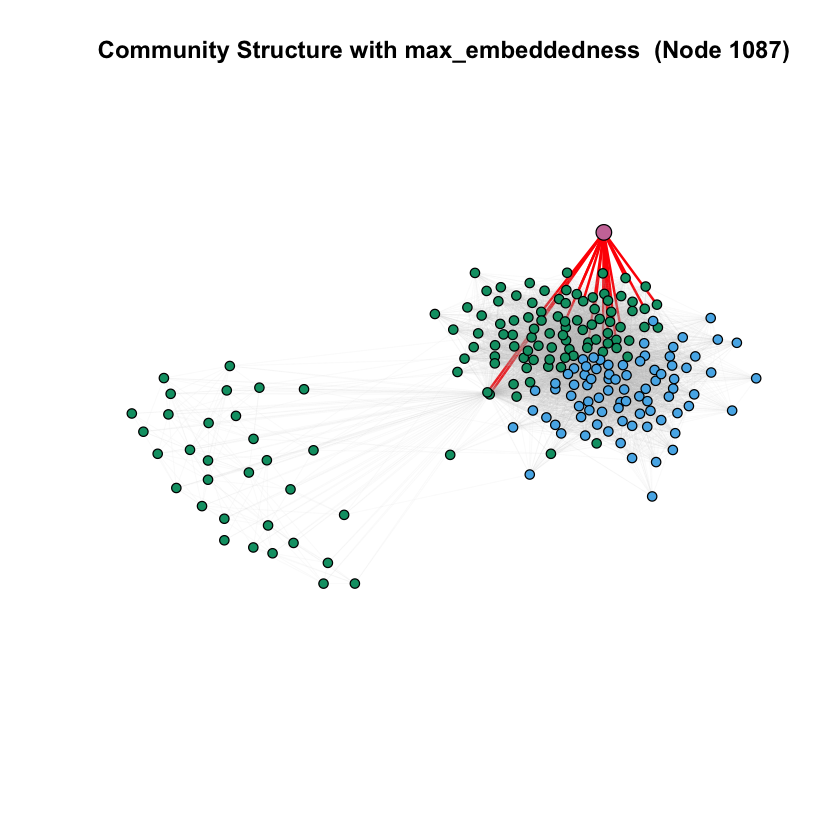

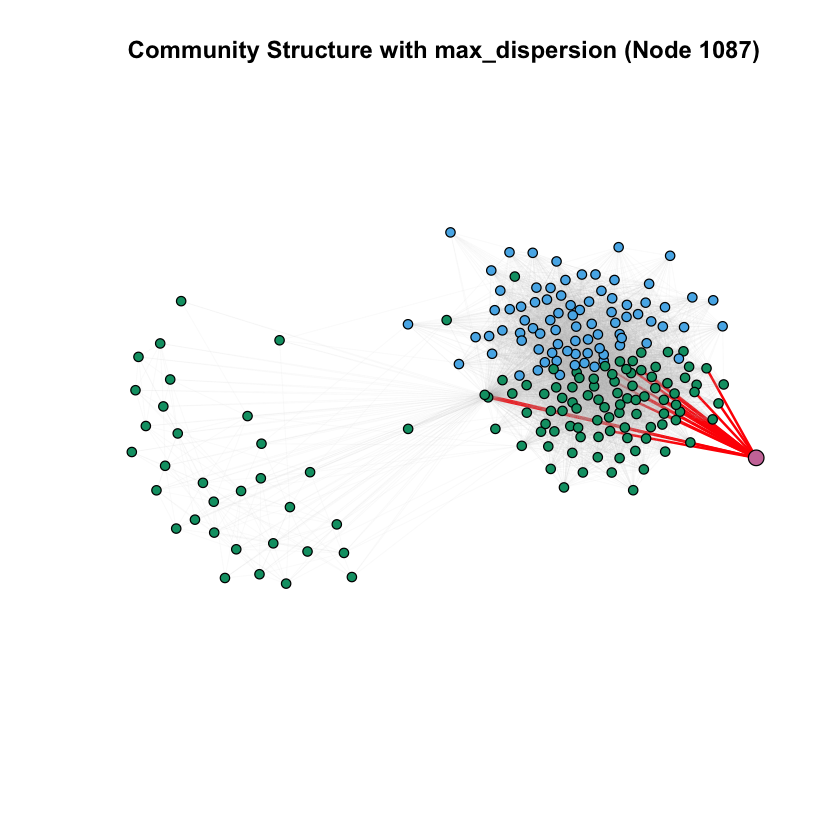

In [68]:
embeddness_dispersion(1087,g)

IGRAPH c51de42 UN-- 1046 27795 -- 
+ attr: name (v/n)
+ edges from c51de42 (vertex names):
 [1]   1-- 59   1--108  59--108   1--172  59--172 108--172 108--349 108--354
 [9] 349--354 108--364 349--364 354--364 108--367 349--367 354--367 364--367
[17] 108--377 349--377 354--377 364--377 367--377 108--390 349--390 108--415
[25] 349--415 364--415 377--415 108--421 349--421 354--421 377--421 108--429
[33] 349--429 354--429 367--429 377--429 415--429 108--476 349--476 354--476
[41] 364--476 367--476 377--476 415--476 429--476 108--484 349--484 354--484
[49] 364--484 367--484 377--484 415--484 421--484 476--484 108--485 349--485
[57] 354--485 364--485 367--485 421--485 429--485 476--485 484--485 108--518
+ ... omitted several edges

IGRAPH 02c01c6 UN-- 348 2866 -- 
+ attr: name (v/n), color (e/c), width (e/n)
+ edges from 02c01c6 (vertex names):
 [1]  1-- 2  1-- 3  1-- 4  1-- 5  1-- 6  1-- 7  1-- 8  1-- 9  1--10  4--10
[11]  1--11  1--12  1--13  1--14  1--15  1--16  1--17  1--18  1--19  1--20
[21] 18--20  1--21  3--21 15--21  1--22 10--22 14--22  1--23  8--23  1--24
[31]  1--25  1--26  4--26 10--26 22--26  1--27  4--27 10--27 14--27 22--27
[41] 26--27  1--28  1--29 15--29  1--30 17--30  1--31 10--31  1--32  8--32
[51] 22--32 26--32  1--33  1--34  1--35  1--36  1--37  1--38  1--39  8--39
[61]  1--40 22--40 26--40  1--41 22--41 26--41 27--41 30--41  1--42 15--42
[71] 18--42 20--42 21--42 29--42  1--43 34--43  1--44  1--45 21--45 42--45
+ ... omitted several edges

In [70]:
id = 415
g1 = induced.subgraph(g, c(id, neighbors(g,id)))
Nr= which(degree(g1) == 24)
length(Nr)

[1] 11

In [77]:
CommonNeighbors = function(i,j,g){
    Si = neighbors(g, i)
    Sj = neighbors(g, j)
    return(length(intersection(Si,Sj)))
}
Jaccard = function(i,j,g){
    Si = neighbors(g, i)
    Sj = neighbors(g, j)
    common = intersection(Si,Sj)
    Union = union(Si,Sj)
    if(length(Union) == 0) return(0)
    else return(length(common) * (1 / length(Union)))
}
AdamicAdar = function(i,j,g){
    Si = neighbors(g, i)
    Sj = neighbors(g, j)
    common = intersection(Si,Sj)
    sum = 0
    for(k in common){
        sum = sum + (1 / log(length(neighbors(g, k)))) 
    }
    return(sum)
}
accuracy_score = function(P, R){
    if(length(R) == 0) return(0)
    else return(length(intersect(P,R)) * (1 / length(R)))
}

In [78]:
iter_num = 10
overall_acc_common = numeric(0)
overall_acc_jaccard = numeric(0)
overall_acc_adamic = numeric(0)
for(user in Nr){
    iter_acc_common = numeric(0)
    iter_acc_jaccard = numeric(0)
    iter_acc_adamic = numeric(0)
    for(i in 1:iter_num){
        g2 = g1
        friend_list = neighbors(g1, user)
        rmv_friend = integer(0)
        for(j in friend_list){
            if(sample(1:4,1) == 1){
                del = sprintf("%s|%s",user,j)
                g2 = g2 - edge(del)
                rmv_friend = c(rmv_friend, j)
            }
        }
        current_friends = neighbors(g2, user)
        unknown = setdiff(V(g2), current_friends)
        unknown = setdiff(unknown,c(user))
        recommend_list = numeric(0)
        Relevance1 = numeric(0)
        Relevance2 = numeric(0)
        Relevance3 = numeric(0)
        for(k in unknown){
            score1 = CommonNeighbors(k, user, g2)
            score2 = Jaccard(k, user, g2)
            score3 = AdamicAdar(k, user, g2)
            Relevance1 = c(Relevance1, score1)
            Relevance2 = c(Relevance2, score2)
            Relevance3 = c(Relevance3, score3)
        }
        o1 = order(Relevance1,decreasing = TRUE)
        o2 = order(Relevance2,decreasing = TRUE)
        o3 = order(Relevance3,decreasing = TRUE)
        Relevance_order1 = unknown[o1]
        Relevance_order2 = unknown[o2]
        Relevance_order3 = unknown[o3]
        recommend_list1 = Relevance_order1[1:length(rmv_friend)]
        recommend_list2 = Relevance_order2[1:length(rmv_friend)]
        recommend_list3 = Relevance_order3[1:length(rmv_friend)]
        acc1 = accuracy_score(recommend_list1, rmv_friend)
        acc2 = accuracy_score(recommend_list2, rmv_friend)
        acc3 = accuracy_score(recommend_list3, rmv_friend)
        sprintf("user%s iter %s Common %s", user,i,acc1)
        sprintf("user%s iter %s Jaccard %s", user,i,acc2)
        sprintf("user%s iter %s Adamic %s", user,i,acc3)
        iter_acc_common = c(iter_acc_common, acc1)
        iter_acc_jaccard = c(iter_acc_jaccard, acc2)
        iter_acc_adamic = c(iter_acc_adamic, acc3)
    }
    overall_acc_common = c(overall_acc_common, mean(iter_acc_common))
    overall_acc_jaccard = c(overall_acc_jaccard,mean(iter_acc_jaccard))
    overall_acc_adamic = c(overall_acc_adamic, mean(iter_acc_adamic))
}

In [79]:
overall_acc_adamic

[1] 0.3430556 0.9750000 0.9357143 0.8064286 0.4169444 0.9732143 0.8955519
 [8] 0.9800000 0.9833333 0.8800000 0.9541667

In [80]:
overall_acc_common

[1] 0.3541667 0.9750000 0.9357143 0.8064286 0.4169444 0.9875000 0.8955519
 [8] 0.9800000 0.9833333 0.8925000 0.9541667

In [81]:
overall_acc_jaccard

[1] 0.2386111 0.9659091 0.8857143 0.8064286 0.5626190 0.9172619 0.8622186
 [8] 0.9800000 0.9833333 0.9125000 0.9097222

In [82]:
mean(overall_acc_adamic)
mean(overall_acc_common)
mean(overall_acc_jaccard)

[1] 0.831219

[1] 0.8346642

[1] 0.8203926